In [ ]:
# Required imports
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model, Input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [ ]:

import random
from PIL import Image
from tqdm import tqdm
#from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.optimizers import Adam

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
base_dir = "/content/drive/MyDrive/damaged_and_undamaged_datasets/AI_for_Art_Restoration_2/paired_dataset_art"
damaged_path = os.path.join(base_dir, "damaged")
undamaged_path = os.path.join(base_dir, "undamaged")

In [ ]:
damaged_files = [f for f in os.listdir(damaged_path) if "before" in f.lower()]
undamaged_files = [f for f in os.listdir(undamaged_path) if "after" in f.lower()]

In [ ]:
def get_base_name(filename):
    return filename.lower().replace("before", "").replace("after", "").replace("_", "").replace("-", "").replace(".png", "").strip()

damaged_map = {get_base_name(f): f for f in damaged_files}
undamaged_map = {get_base_name(f): f for f in undamaged_files}

common_keys = list(set(damaged_map.keys()) & set(undamaged_map.keys()))
print(f"✅ Matched {len(common_keys)} before–after image pairs.")

✅ Matched 111 before–after image pairs.


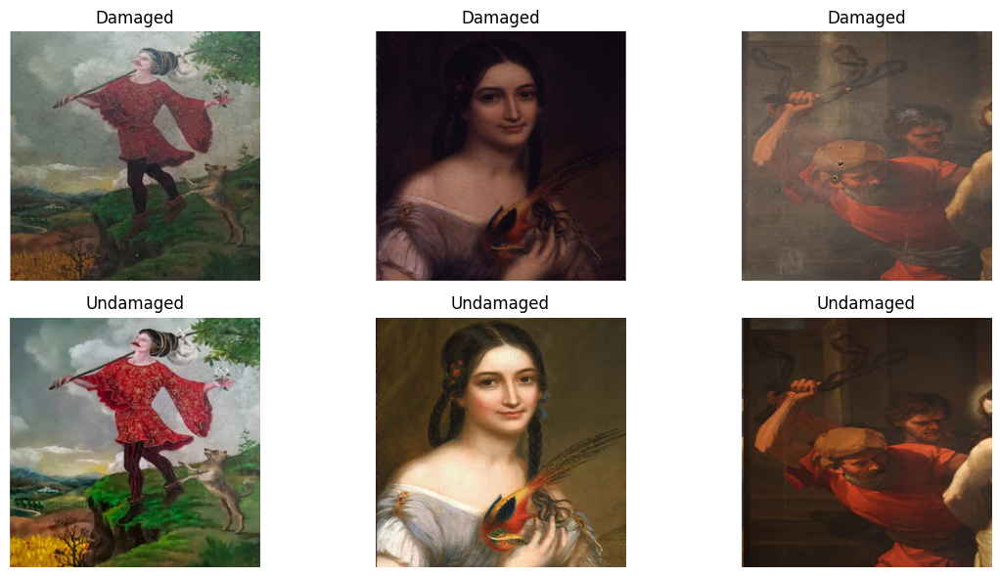

In [ ]:
# Pick 3 random keys
random_keys = random.sample(common_keys, 3)

fig, axes = plt.subplots(2, 3, figsize=(12, 6))
img_size = (256, 256)

for i, key in enumerate(random_keys):
    damaged_img = Image.open(os.path.join(damaged_path, damaged_map[key])).convert("RGB").resize(img_size)
    undamaged_img = Image.open(os.path.join(undamaged_path, undamaged_map[key])).convert("RGB").resize(img_size)

    axes[0, i].imshow(damaged_img)
    axes[0, i].set_title("Damaged")
    axes[0, i].axis('off')

    axes[1, i].imshow(undamaged_img)
    axes[1, i].set_title("Undamaged")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

Processing 111 matched image pairs...


100%|██████████| 111/111 [00:03<00:00, 33.43it/s]


✅ Input (damaged) shape: (111, 256, 256, 3)
✅ Target (undamaged) shape: (111, 256, 256, 3)
✅ Noise target shape: (111, 256, 256, 3)
Noise range: [-1.000, 1.000]

📊 Train: 88 samples | Val: 23 samples


Model: "NoisePredictor_UNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ damaged_input       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ damaged_input[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ re_lu[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,864 │ re_lu_2[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │     36,864 │ re_lu_3[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ channel_attention   │ (None, 128, 128,  │      1,096 │ batch_normalizat

 Total params: 16,596,627 (63.31 MB)

 Trainable params: 16,585,779 (63.27 MB)

 Non-trainable params: 10,848 (42.38 KB)


🚀 Starting training...
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 0.3957 - mae: 0.4362 - mse: 0.3014 - noise_mae: 0.4362 - noise_psnr: 12.1725
Epoch 1: val_loss improved from inf to 1.02371, saving model to best_noise_predictor.h5


5/5 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - loss: 0.3808 - mae: 0.4207 - mse: 0.2875 - noise_mae: 0.4207 - noise_psnr: 12.5263 - val_loss: 1.0237 - val_mae: 1.0082 - val_mse: 1.0598 - val_noise_mae: 1.0140 - val_noise_psnr: 5.8062 - learning_rate: 0.0010
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step - loss: 0.1484 - mae: 0.1799 - mse: 0.0750 - noise_mae: 0.1799 - noise_psnr: 18.8874
Epoch 2: val_loss improved from 1.02371 to 1.02366, saving model to best_noise_predictor.h5


5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 740ms/step - loss: 0.1480 - mae: 0.1795 - mse: 0.0743 - noise_mae: 0.1795 - noise_psnr: 18.9268 - val_loss: 1.0237 - val_mae: 1.0086 - val_mse: 1.0588 - val_noise_mae: 1.0150 - val_noise_psnr: 5.8013 - learning_rate: 0.0010
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - loss: 0.1285 - mae: 0.1592 - mse: 0.0569 - noise_mae: 0.1592 - noise_psnr: 20.0692
Epoch 3: val_loss did not improve from 1.02366
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 533ms/step - loss: 0.1277 - mae: 0.1584 - mse: 0.0562 - noise_mae: 0.1584 - noise_psnr: 20.1224 - val_loss: 1.0256 - val_mae: 1.0100 - val_mse: 1.0618 - val_noise_mae: 1.0165 - val_noise_psnr: 5.7927 - learning_rate: 0.0010
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - loss: 0.1225 - mae: 0.1530 - mse: 0.0515 - noise_mae: 0.1530 - noise_psnr: 20.5614
Epoch 4: val_loss did not improve from 1.02366
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 538ms/step - loss: 0.1231 - mae: 0.1536 - mse: 0.0519 - noise_mae: 0.1536 - noise_psnr: 20.5362 - val_

5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 725ms/step - loss: 0.1135 - mae: 0.1430 - mse: 0.0446 - noise_mae: 0.1430 - noise_psnr: 21.1444 - val_loss: 0.9315 - val_mae: 0.9184 - val_mse: 0.9622 - val_noise_mae: 0.9359 - val_noise_psnr: 6.7790 - learning_rate: 5.0000e-04
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 0.1105 - mae: 0.1403 - mse: 0.0411 - noise_mae: 0.1403 - noise_psnr: 21.3549
Epoch 11: val_loss improved from 0.93153 to 0.56676, saving model to best_noise_predictor.h5


5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 740ms/step - loss: 0.1110 - mae: 0.1409 - mse: 0.0413 - noise_mae: 0.1409 - noise_psnr: 21.3267 - val_loss: 0.5668 - val_mae: 0.5750 - val_mse: 0.5476 - val_noise_mae: 0.5765 - val_noise_psnr: 10.3973 - learning_rate: 5.0000e-04
Epoch 12/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step - loss: 0.1122 - mae: 0.1423 - mse: 0.0420 - noise_mae: 0.1423 - noise_psnr: 20.8838
Epoch 12: val_loss improved from 0.56676 to 0.18434, saving model to best_noise_predictor.h5


5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 956ms/step - loss: 0.1121 - mae: 0.1421 - mse: 0.0420 - noise_mae: 0.1421 - noise_psnr: 20.9261 - val_loss: 0.1843 - val_mae: 0.2151 - val_mse: 0.1125 - val_noise_mae: 0.2109 - val_noise_psnr: 18.0580 - learning_rate: 5.0000e-04
Epoch 13/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 0.1143 - mae: 0.1445 - mse: 0.0437 - noise_mae: 0.1445 - noise_psnr: 21.0924
Epoch 13: val_loss improved from 0.18434 to 0.11728, saving model to best_noise_predictor.h5


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.1137 - mae: 0.1439 - mse: 0.0433 - noise_mae: 0.1439 - noise_psnr: 21.1065 - val_loss: 0.1173 - val_mae: 0.1499 - val_mse: 0.0412 - val_noise_mae: 0.1468 - val_noise_psnr: 20.6849 - learning_rate: 5.0000e-04
Epoch 14/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step - loss: 0.1065 - mae: 0.1362 - mse: 0.0371 - noise_mae: 0.1362 - noise_psnr: 21.3683
Epoch 14: val_loss improved from 0.11728 to 0.11725, saving model to best_noise_predictor.h5


5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 717ms/step - loss: 0.1070 - mae: 0.1368 - mse: 0.0375 - noise_mae: 0.1368 - noise_psnr: 21.3590 - val_loss: 0.1172 - val_mae: 0.1498 - val_mse: 0.0412 - val_noise_mae: 0.1468 - val_noise_psnr: 20.6870 - learning_rate: 5.0000e-04
Epoch 15/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step - loss: 0.1130 - mae: 0.1431 - mse: 0.0428 - noise_mae: 0.1431 - noise_psnr: 21.0243
Epoch 15: val_loss did not improve from 0.11725
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 514ms/step - loss: 0.1124 - mae: 0.1425 - mse: 0.0423 - noise_mae: 0.1425 - noise_psnr: 21.0551 - val_loss: 0.1338 - val_mae: 0.1672 - val_mse: 0.0559 - val_noise_mae: 0.1624 - val_noise_psnr: 19.4311 - learning_rate: 5.0000e-04
Epoch 16/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step - loss: 0.1063 - mae: 0.1361 - mse: 0.0366 - noise_mae: 0.1361 - noise_psnr: 21.4291
Epoch 16: val_loss did not improve from 0.11725
5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 508ms/step - loss: 0.1065 - mae: 0.1363 - mse: 0.0369 - noise_mae: 0.1363 - noise_psnr: 

5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 717ms/step - loss: 0.1045 - mae: 0.1344 - mse: 0.0348 - noise_mae: 0.1344 - noise_psnr: 21.5855 - val_loss: 0.1171 - val_mae: 0.1496 - val_mse: 0.0414 - val_noise_mae: 0.1464 - val_noise_psnr: 20.6602 - learning_rate: 2.5000e-04
Epoch 24/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step - loss: 0.1053 - mae: 0.1352 - mse: 0.0356 - noise_mae: 0.1352 - noise_psnr: 21.6415
Epoch 24: val_loss improved from 0.11714 to 0.11700, saving model to best_noise_predictor.h5


5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 799ms/step - loss: 0.1054 - mae: 0.1353 - mse: 0.0357 - noise_mae: 0.1353 - noise_psnr: 21.6316 - val_loss: 0.1170 - val_mae: 0.1494 - val_mse: 0.0413 - val_noise_mae: 0.1460 - val_noise_psnr: 20.6694 - learning_rate: 2.5000e-04
Epoch 25/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - loss: 0.1061 - mae: 0.1359 - mse: 0.0366 - noise_mae: 0.1359 - noise_psnr: 21.5283
Epoch 25: val_loss improved from 0.11700 to 0.11688, saving model to best_noise_predictor.h5


5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 718ms/step - loss: 0.1064 - mae: 0.1362 - mse: 0.0367 - noise_mae: 0.1362 - noise_psnr: 21.5127 - val_loss: 0.1169 - val_mae: 0.1493 - val_mse: 0.0412 - val_noise_mae: 0.1459 - val_noise_psnr: 20.6791 - learning_rate: 2.5000e-04
Epoch 26/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 0.1016 - mae: 0.1304 - mse: 0.0346 - noise_mae: 0.1304 - noise_psnr: 21.7894
Epoch 26: val_loss improved from 0.11688 to 0.11683, saving model to best_noise_predictor.h5


5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 729ms/step - loss: 0.1026 - mae: 0.1315 - mse: 0.0350 - noise_mae: 0.1315 - noise_psnr: 21.7296 - val_loss: 0.1168 - val_mae: 0.1493 - val_mse: 0.0411 - val_noise_mae: 0.1459 - val_noise_psnr: 20.6815 - learning_rate: 2.5000e-04
Epoch 27/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 0.1135 - mae: 0.1450 - mse: 0.0399 - noise_mae: 0.1450 - noise_psnr: 20.8100
Epoch 27: val_loss did not improve from 0.11683
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 535ms/step - loss: 0.1129 - mae: 0.1443 - mse: 0.0396 - noise_mae: 0.1443 - noise_psnr: 20.8794 - val_loss: 0.1169 - val_mae: 0.1493 - val_mse: 0.0412 - val_noise_mae: 0.1457 - val_noise_psnr: 20.6745 - learning_rate: 2.5000e-04
Epoch 28/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - loss: 0.1101 - mae: 0.1409 - mse: 0.0381 - noise_mae: 0.1409 - noise_psnr: 21.0910
Epoch 28: val_loss did not improve from 0.11683
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 526ms/step - loss: 0.1095 - mae: 0.1403 - mse: 0.0379 - noise_mae: 0.1403 - noise_psnr: 

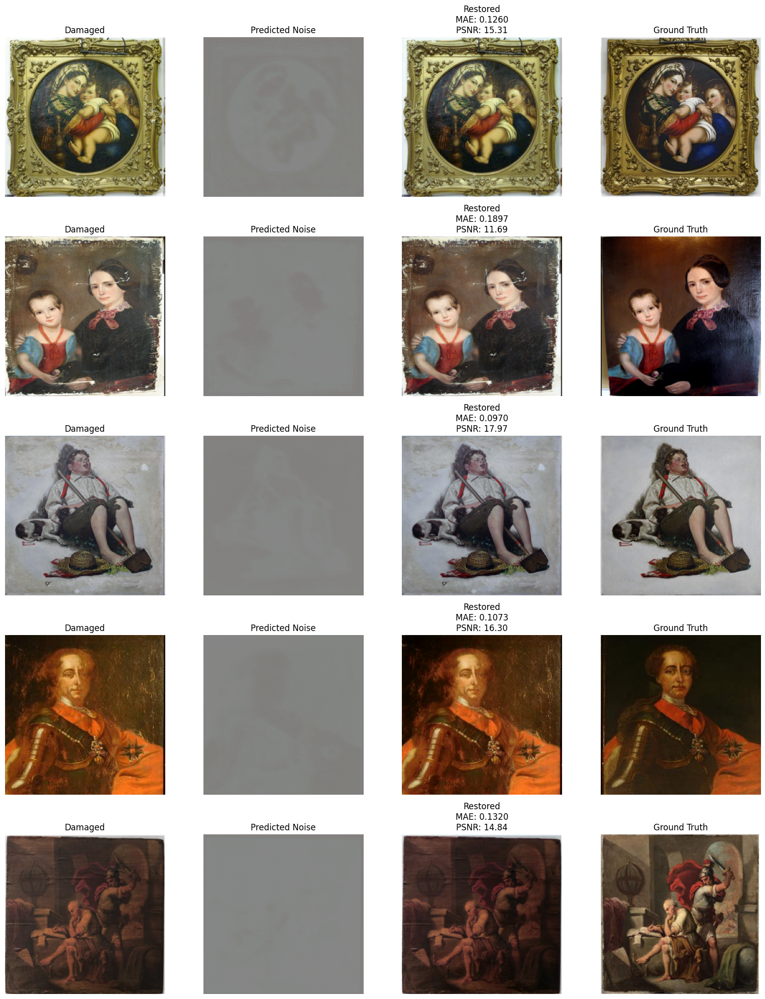


✅ Model training complete!
Use restore_image(model, damaged_img) to restore new images


In [ ]:
# ---------- Image dimensions ----------
img_size = (256, 256)

# ---------- Prepare arrays ----------
X = []  # Damaged images (input)
Y = []  # Undamaged images (target)

print(f"Processing {len(common_keys)} matched image pairs...")

for key in tqdm(common_keys):
    try:
        damaged_img = Image.open(os.path.join(damaged_path, damaged_map[key])).convert("RGB").resize(img_size)
        undamaged_img = Image.open(os.path.join(undamaged_path, undamaged_map[key])).convert("RGB").resize(img_size)

        X.append(np.array(damaged_img) / 255.0)   # Normalize to [0,1]
        Y.append(np.array(undamaged_img) / 255.0)
    except Exception as e:
        print(f"⚠️ Error processing {key}: {e}")

# Convert lists to NumPy arrays
X = np.array(X)
Y = np.array(Y)

# ---------- Calculate noise target ----------
Y_noise = X - Y  # This is what the model will predict

print("✅ Input (damaged) shape:", X.shape)
print("✅ Target (undamaged) shape:", Y.shape)
print("✅ Noise target shape:", Y_noise.shape)
print(f"Noise range: [{Y_noise.min():.3f}, {Y_noise.max():.3f}]")

# -------------------------
# Enhanced metrics for noise prediction
# -------------------------
def noise_psnr(y_true, y_pred):
    """PSNR for noise (typically lower values since noise has smaller range)"""
    return tf.image.psnr(y_true, y_pred, max_val=2.0)  # noise ranges from -1 to 1

def noise_ssim(y_true, y_pred):
    """SSIM for noise prediction"""
    return tf.image.ssim(y_true, y_pred, max_val=2.0)

class NoiseMAE(tf.keras.metrics.Metric):
    """Custom MAE metric for noise"""
    def __init__(self, name="noise_mae", **kwargs):
        super().__init__(name=name, **kwargs)
        self.total = self.add_weight(name="total", initializer="zeros")
        self.count = self.add_weight(name="count", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        mae = tf.reduce_mean(tf.abs(y_true - y_pred))
        self.total.assign_add(mae)
        self.count.assign_add(1.0)

    def result(self):
        return self.total / self.count

    def reset_states(self):
        self.total.assign(0.0)
        self.count.assign(0.0)

# -------------------------
# Attention Block for better feature learning
# -------------------------
class ChannelAttention(layers.Layer):
    def __init__(self, filters, ratio=8, **kwargs):
        super().__init__(**kwargs)
        self.filters = filters
        self.ratio = ratio
        self.shared_dense1 = layers.Dense(filters // ratio, activation='relu')
        self.shared_dense2 = layers.Dense(filters, activation='sigmoid')

    def call(self, inputs):
        avg_pool = tf.reduce_mean(inputs, axis=[1, 2], keepdims=True)
        max_pool = tf.reduce_max(inputs, axis=[1, 2], keepdims=True)

        avg_out = self.shared_dense2(self.shared_dense1(tf.squeeze(avg_pool, [1, 2])))
        max_out = self.shared_dense2(self.shared_dense1(tf.squeeze(max_pool, [1, 2])))

        attention = tf.expand_dims(tf.expand_dims(avg_out + max_out, 1), 1)
        return inputs * attention

# -------------------------
# Residual block with attention
# -------------------------
def residual_attention_block(x, filters, use_attention=True):
    shortcut = x

    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)

    if use_attention:
        x = ChannelAttention(filters)(x)

    x = layers.Add()([x, shortcut])
    x = layers.ReLU()(x)
    return x

# -------------------------
# Build NOISE PREDICTION model (simplified, focused architecture)
# -------------------------
def build_noise_prediction_model(input_shape=(256, 256, 3), base_filters=32):
    """
    U-Net style architecture optimized for noise prediction
    Smaller base_filters for efficiency and to prevent overfitting
    """
    inputs = Input(shape=input_shape, name="damaged_input")

    # ===== ENCODER =====
    # Block 1: 256x256
    c1 = layers.Conv2D(base_filters, 3, padding="same")(inputs)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.ReLU()(c1)
    c1 = layers.Conv2D(base_filters, 3, padding="same")(c1)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.ReLU()(c1)
    p1 = layers.MaxPooling2D(2)(c1)

    # Block 2: 128x128
    c2 = layers.Conv2D(base_filters * 2, 3, padding="same")(p1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.ReLU()(c2)
    c2 = residual_attention_block(c2, base_filters * 2)
    p2 = layers.MaxPooling2D(2)(c2)

    # Block 3: 64x64
    c3 = layers.Conv2D(base_filters * 4, 3, padding="same")(p2)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.ReLU()(c3)
    c3 = residual_attention_block(c3, base_filters * 4)
    p3 = layers.MaxPooling2D(2)(c3)

    # Block 4: 32x32
    c4 = layers.Conv2D(base_filters * 8, 3, padding="same")(p3)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.ReLU()(c4)
    c4 = residual_attention_block(c4, base_filters * 8)
    p4 = layers.MaxPooling2D(2)(c4)

    # ===== BOTTLENECK: 16x16 =====
    bn = layers.Conv2D(base_filters * 16, 3, padding="same")(p4)
    bn = layers.BatchNormalization()(bn)
    bn = layers.ReLU()(bn)
    bn = residual_attention_block(bn, base_filters * 16)
    bn = residual_attention_block(bn, base_filters * 16)

    # ===== DECODER =====
    # Up Block 1: 16x16 -> 32x32
    u4 = layers.Conv2DTranspose(base_filters * 8, 2, strides=2, padding="same")(bn)
    u4 = layers.Concatenate()([u4, c4])
    u4 = layers.Conv2D(base_filters * 8, 3, padding="same")(u4)
    u4 = layers.BatchNormalization()(u4)
    u4 = layers.ReLU()(u4)
    u4 = residual_attention_block(u4, base_filters * 8)

    # Up Block 2: 32x32 -> 64x64
    u3 = layers.Conv2DTranspose(base_filters * 4, 2, strides=2, padding="same")(u4)
    u3 = layers.Concatenate()([u3, c3])
    u3 = layers.Conv2D(base_filters * 4, 3, padding="same")(u3)
    u3 = layers.BatchNormalization()(u3)
    u3 = layers.ReLU()(u3)
    u3 = residual_attention_block(u3, base_filters * 4)

    # Up Block 3: 64x64 -> 128x128
    u2 = layers.Conv2DTranspose(base_filters * 2, 2, strides=2, padding="same")(u3)
    u2 = layers.Concatenate()([u2, c2])
    u2 = layers.Conv2D(base_filters * 2, 3, padding="same")(u2)
    u2 = layers.BatchNormalization()(u2)
    u2 = layers.ReLU()(u2)
    u2 = residual_attention_block(u2, base_filters * 2)

    # Up Block 4: 128x128 -> 256x256
    u1 = layers.Conv2DTranspose(base_filters, 2, strides=2, padding="same")(u2)
    u1 = layers.Concatenate()([u1, c1])
    u1 = layers.Conv2D(base_filters, 3, padding="same")(u1)
    u1 = layers.BatchNormalization()(u1)
    u1 = layers.ReLU()(u1)
    u1 = residual_attention_block(u1, base_filters, use_attention=False)

    # ===== OUTPUT: Predict noise =====
    # Final refinement
    output = layers.Conv2D(base_filters // 2, 3, padding="same")(u1)
    output = layers.BatchNormalization()(output)
    output = layers.ReLU()(output)

    # Predict noise (can range from -1 to 1, so use tanh)
    noise_output = layers.Conv2D(3, 1, padding="same", activation="tanh", name="predicted_noise")(output)

    model = Model(inputs=inputs, outputs=noise_output, name="NoisePredictor_UNet")
    return model

# -------------------------
# Prepare train/val sets
# -------------------------
assert X.shape[0] == Y.shape[0], "X and Y must have same number of samples"

X_train, X_val, Y_noise_train, Y_noise_val, Y_train, Y_val = train_test_split(
    X, Y_noise, Y, test_size=0.2, random_state=42
)
print(f"\n📊 Train: {X_train.shape[0]} samples | Val: {X_val.shape[0]} samples")

# -------------------------
# Build & compile model
# -------------------------
tf.keras.backend.clear_session()
model = build_noise_prediction_model(input_shape=X.shape[1:], base_filters=32)

# Use a combination of losses for better noise prediction
def combined_loss(y_true, y_pred):
    """Combination of MAE and MSE for robust noise prediction"""
    mae = tf.reduce_mean(tf.abs(y_true - y_pred))
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    return 0.7 * mae + 0.3 * mse

# Use fixed learning rate so ReduceLROnPlateau can adjust it
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss=combined_loss,
    metrics=[
        'mae',
        'mse',
        noise_psnr,
        NoiseMAE()
    ]
)

model.summary()

# -------------------------
# Data augmentation pipeline
# -------------------------
BATCH_SIZE = 16  # Increased for better gradient estimates
AUTOTUNE = tf.data.AUTOTUNE

def augment_noise_pair(damaged, noise_target):
    """Apply consistent augmentations to both damaged image and noise"""
    # Stack to apply same transforms
    stacked = tf.concat([damaged, noise_target], axis=-1)

    # Random flips
    if tf.random.uniform(()) > 0.5:
        stacked = tf.image.flip_left_right(stacked)
    if tf.random.uniform(()) > 0.5:
        stacked = tf.image.flip_up_down(stacked)

    # Random 90-degree rotation
    k = tf.random.uniform((), 0, 4, dtype=tf.int32)
    stacked = tf.image.rot90(stacked, k)

    # Random brightness/contrast adjustment (only on damaged image)
    damaged_aug = stacked[..., :3]
    noise_aug = stacked[..., 3:]

    # Slight brightness adjustment
    if tf.random.uniform(()) > 0.5:
        delta = tf.random.uniform((), -0.1, 0.1)
        damaged_aug = tf.clip_by_value(damaged_aug + delta, 0.0, 1.0)

    return damaged_aug, noise_aug

def make_dataset(X_in, Y_noise_in, training=True):
    ds = tf.data.Dataset.from_tensor_slices((
        X_in.astype(np.float32),
        Y_noise_in.astype(np.float32)
    ))

    if training:
        ds = ds.shuffle(2048, reshuffle_each_iteration=True)
        ds = ds.map(augment_noise_pair, num_parallel_calls=AUTOTUNE)

    ds = ds.batch(BATCH_SIZE, drop_remainder=training)
    ds = ds.prefetch(AUTOTUNE)
    return ds

train_ds = make_dataset(X_train, Y_noise_train, training=True)
val_ds = make_dataset(X_val, Y_noise_val, training=False)

# -------------------------
# Callbacks & training
# -------------------------
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=20,
        mode='min',
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ModelCheckpoint(
        "best_noise_predictor.h5",
        monitor="val_loss",
        save_best_only=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-7,
        verbose=1
    )
]

# -------------------------
# Train the model
# -------------------------
print("\n🚀 Starting training...")
EPOCHS = 100

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks,
    verbose=1
)

# -------------------------
# Evaluation & visualization
# -------------------------
print("\n📈 Evaluating model...")

# Predict noise on validation set
sample_indices = np.random.choice(len(X_val), min(5, len(X_val)), replace=False)

fig, axes = plt.subplots(len(sample_indices), 4, figsize=(16, 4 * len(sample_indices)))
if len(sample_indices) == 1:
    axes = axes.reshape(1, -1)

for idx, sample_idx in enumerate(sample_indices):
    damaged_img = X_val[sample_idx:sample_idx+1]
    true_noise = Y_noise_val[sample_idx]
    clean_img = Y_val[sample_idx]

    # Predict noise
    pred_noise = model.predict(damaged_img, verbose=0)[0]

    # Manually restore image
    restored_img = np.clip(damaged_img[0] - pred_noise, 0, 1)

    # Calculate metrics
    mae = np.mean(np.abs(restored_img - clean_img))
    psnr = 10 * np.log10(1.0 / np.mean((restored_img - clean_img) ** 2))

    axes[idx, 0].imshow(damaged_img[0])
    axes[idx, 0].set_title("Damaged")
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow((pred_noise + 1) / 2)  # Scale noise to [0,1] for visualization
    axes[idx, 1].set_title("Predicted Noise")
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(restored_img)
    axes[idx, 2].set_title(f"Restored\nMAE: {mae:.4f}\nPSNR: {psnr:.2f}")
    axes[idx, 2].axis('off')

    axes[idx, 3].imshow(clean_img)
    axes[idx, 3].set_title("Ground Truth")
    axes[idx, 3].axis('off')

plt.tight_layout()
plt.savefig('noise_prediction_results.png', dpi=150, bbox_inches='tight')
plt.show()

# -------------------------
# Function to use the model for restoration
# -------------------------
def restore_image(model, damaged_image):
    """
    Restore a damaged image by predicting and removing noise

    Args:
        model: Trained noise prediction model
        damaged_image: numpy array of shape (H, W, 3) in range [0, 1]

    Returns:
        restored_image: numpy array of shape (H, W, 3) in range [0, 1]
    """
    # Ensure batch dimension
    if len(damaged_image.shape) == 3:
        damaged_image = np.expand_dims(damaged_image, 0)

    # Predict noise
    predicted_noise = model.predict(damaged_image, verbose=0)

    # Remove noise and clip to valid range
    restored = np.clip(damaged_image - predicted_noise, 0, 1)

    return restored[0] if len(damaged_image) == 1 else restored

print("\n✅ Model training complete!")
print("Use restore_image(model, damaged_img) to restore new images")

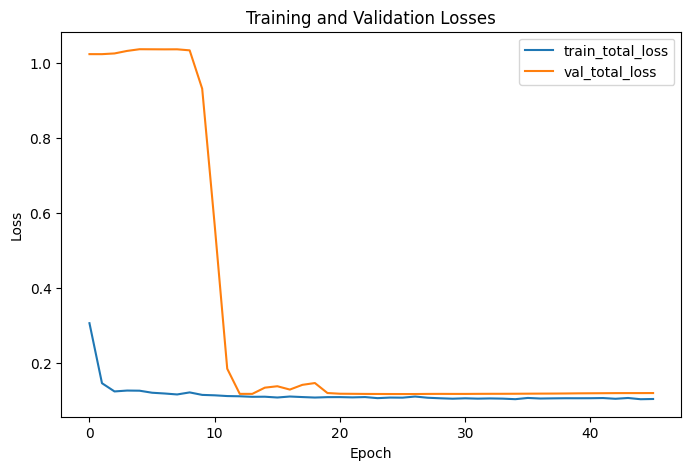

In [ ]:
# -------------------------
# Plot training / validation losses
# -------------------------
hist = history.history
plt.figure(figsize=(8,5))
plt.plot(hist["loss"], label="train_total_loss")
plt.plot(hist["val_loss"], label="val_total_loss")
# also plot restored-specific losses
if "restored_image_loss" in hist:
    plt.plot(hist["restored_image_loss"], label="train_restored_mae")
if "val_restored_image_loss" in hist:
    plt.plot(hist["val_restored_image_loss"], label="val_restored_mae")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Losses")
plt.show()

#Ver2

Processing 111 matched image pairs...


100%|██████████| 111/111 [00:03<00:00, 31.29it/s]


✅ Input (damaged) shape: (111, 256, 256, 3)
✅ Target (undamaged) shape: (111, 256, 256, 3)
✅ Noise target shape: (111, 256, 256, 3)
Noise range: [-1.000, 1.000]
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

📊 Train: 88 samples | Val: 23 samples


Model: "AdvancedNoisePredictor_AdaIN"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ damaged_input       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      9,472 │ damaged_input[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ re_lu[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ re_lu_2[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cbam (CBAM)         │ (None, 128, 128,  │      4,339 │ re_lu_3[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ cbam[0][0]        │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[

 Total params: 55,676,268 (212.39 MB)

 Trainable params: 55,654,572 (212.31 MB)

 Non-trainable params: 21,696 (84.75 KB)


🚀 Starting training with AdaIN and advanced skip connections...
Epoch 1/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 871ms/step - loss: 13.1847 - mae: 0.3051 - mse: 0.1508 - noise_mae: 0.3051 - noise_psnr: 15.0681
Epoch 1: val_loss improved from inf to 10.57828, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 141s 5s/step - loss: 13.0280 - mae: 0.3025 - mse: 0.1487 - noise_mae: 0.3025 - noise_psnr: 15.1543 - val_loss: 10.5783 - val_mae: 0.2204 - val_mse: 0.0777 - val_noise_mae: 0.2198 - val_noise_psnr: 17.4847 - learning_rate: 5.0000e-04
Epoch 2/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 872ms/step - loss: 8.7715 - mae: 0.2132 - mse: 0.0752 - noise_mae: 0.2132 - noise_psnr: 18.2368
Epoch 2: val_loss did not improve from 10.57828
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 8.7358 - mae: 0.2119 - mse: 0.0745 - noise_mae: 0.2119 - noise_psnr: 18.2851 - val_loss: 13.7353 - val_mae: 0.3584 - val_mse: 0.1981 - val_noise_mae: 0.3577 - val_noise_psnr: 13.2366 - learning_rate: 5.0000e-04
Epoch 3/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 873ms/step - loss: 7.7981 - mae: 0.1651 - mse: 0.0495 - noise_mae: 0.1651 - noise_psnr: 20.0151
Epoch 3: val_loss did not improve from 10.57828
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 965ms/step - loss: 7.7925 - mae: 0.1645 - mse: 0.0492 - noise_mae: 0.1645 - noi

11/11 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - loss: 7.5154 - mae: 0.1513 - mse: 0.0432 - noise_mae: 0.1513 - noise_psnr: 20.6942 - val_loss: 9.6996 - val_mae: 0.1923 - val_mse: 0.0623 - val_noise_mae: 0.1916 - val_noise_psnr: 18.5936 - learning_rate: 5.0000e-04
Epoch 5/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 864ms/step - loss: 7.2460 - mae: 0.1400 - mse: 0.0366 - noise_mae: 0.1400 - noise_psnr: 21.1415
Epoch 5: val_loss improved from 9.69960 to 8.08714, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - loss: 7.2595 - mae: 0.1403 - mse: 0.0369 - noise_mae: 0.1403 - noise_psnr: 21.1301 - val_loss: 8.0871 - val_mae: 0.1565 - val_mse: 0.0437 - val_noise_mae: 0.1562 - val_noise_psnr: 20.3660 - learning_rate: 5.0000e-04
Epoch 6/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 882ms/step - loss: 7.4999 - mae: 0.1354 - mse: 0.0365 - noise_mae: 0.1354 - noise_psnr: 21.3781
Epoch 6: val_loss improved from 8.08714 to 7.86343, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 7.4893 - mae: 0.1362 - mse: 0.0369 - noise_mae: 0.1362 - noise_psnr: 21.3429 - val_loss: 7.8634 - val_mae: 0.1560 - val_mse: 0.0431 - val_noise_mae: 0.1557 - val_noise_psnr: 20.4785 - learning_rate: 5.0000e-04
Epoch 7/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 894ms/step - loss: 7.3974 - mae: 0.1411 - mse: 0.0385 - noise_mae: 0.1411 - noise_psnr: 21.1799
Epoch 7: val_loss did not improve from 7.86343
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 990ms/step - loss: 7.3920 - mae: 0.1415 - mse: 0.0387 - noise_mae: 0.1415 - noise_psnr: 21.1591 - val_loss: 7.8685 - val_mae: 0.1546 - val_mse: 0.0424 - val_noise_mae: 0.1543 - val_noise_psnr: 20.5329 - learning_rate: 5.0000e-04
Epoch 8/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 893ms/step - loss: 7.2611 - mae: 0.1458 - mse: 0.0402 - noise_mae: 0.1458 - noise_psnr: 20.8490
Epoch 8: val_loss did not improve from 7.86343
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 994ms/step - loss: 7.2593 - mae: 0.1457 - mse: 0.0402 - noise_mae: 0.1457 - noise_

11/11 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 6.6560 - mae: 0.1449 - mse: 0.0379 - noise_mae: 0.1449 - noise_psnr: 21.0873 - val_loss: 7.8060 - val_mae: 0.1504 - val_mse: 0.0418 - val_noise_mae: 0.1498 - val_noise_psnr: 20.6127 - learning_rate: 5.0000e-04
Epoch 13/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 861ms/step - loss: 6.5034 - mae: 0.1399 - mse: 0.0339 - noise_mae: 0.1399 - noise_psnr: 21.4729
Epoch 13: val_loss improved from 7.80601 to 7.80545, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 6.5187 - mae: 0.1405 - mse: 0.0343 - noise_mae: 0.1405 - noise_psnr: 21.4379 - val_loss: 7.8054 - val_mae: 0.1522 - val_mse: 0.0428 - val_noise_mae: 0.1515 - val_noise_psnr: 20.5232 - learning_rate: 5.0000e-04
Epoch 14/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 886ms/step - loss: 6.6735 - mae: 0.1516 - mse: 0.0383 - noise_mae: 0.1516 - noise_psnr: 20.9009
Epoch 14: val_loss did not improve from 7.80545
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 980ms/step - loss: 6.6740 - mae: 0.1515 - mse: 0.0383 - noise_mae: 0.1515 - noise_psnr: 20.8998 - val_loss: 7.8158 - val_mae: 0.1573 - val_mse: 0.0453 - val_noise_mae: 0.1565 - val_noise_psnr: 20.2917 - learning_rate: 5.0000e-04
Epoch 15/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 930ms/step - loss: 6.6768 - mae: 0.1516 - mse: 0.0404 - noise_mae: 0.1516 - noise_psnr: 20.7706
Epoch 15: val_loss improved from 7.80545 to 7.78052, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 32s 3s/step - loss: 6.6792 - mae: 0.1513 - mse: 0.0403 - noise_mae: 0.1513 - noise_psnr: 20.7847 - val_loss: 7.7805 - val_mae: 0.1553 - val_mse: 0.0444 - val_noise_mae: 0.1546 - val_noise_psnr: 20.3772 - learning_rate: 5.0000e-04
Epoch 16/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 871ms/step - loss: 6.7513 - mae: 0.1487 - mse: 0.0398 - noise_mae: 0.1487 - noise_psnr: 20.8176
Epoch 16: val_loss improved from 7.78052 to 7.67598, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - loss: 6.7416 - mae: 0.1484 - mse: 0.0396 - noise_mae: 0.1484 - noise_psnr: 20.8333 - val_loss: 7.6760 - val_mae: 0.1516 - val_mse: 0.0425 - val_noise_mae: 0.1509 - val_noise_psnr: 20.5540 - learning_rate: 5.0000e-04
Epoch 17/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 889ms/step - loss: 6.3345 - mae: 0.1532 - mse: 0.0389 - noise_mae: 0.1532 - noise_psnr: 20.8455
Epoch 17: val_loss improved from 7.67598 to 7.59052, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 6.3499 - mae: 0.1528 - mse: 0.0388 - noise_mae: 0.1528 - noise_psnr: 20.8557 - val_loss: 7.5905 - val_mae: 0.1501 - val_mse: 0.0415 - val_noise_mae: 0.1495 - val_noise_psnr: 20.6418 - learning_rate: 5.0000e-04
Epoch 18/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 886ms/step - loss: 6.4146 - mae: 0.1415 - mse: 0.0343 - noise_mae: 0.1415 - noise_psnr: 21.3109
Epoch 18: val_loss did not improve from 7.59052
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 983ms/step - loss: 6.4137 - mae: 0.1419 - mse: 0.0345 - noise_mae: 0.1419 - noise_psnr: 21.2986 - val_loss: 7.5946 - val_mae: 0.1470 - val_mse: 0.0401 - val_noise_mae: 0.1465 - val_noise_psnr: 20.7831 - learning_rate: 5.0000e-04
Epoch 19/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 906ms/step - loss: 6.2555 - mae: 0.1482 - mse: 0.0376 - noise_mae: 0.1482 - noise_psnr: 21.1323
Epoch 19: val_loss did not improve from 7.59052
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 6.2680 - mae: 0.1483 - mse: 0.0377 - noise_mae: 0.1483 - noise

11/11 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 6.5424 - mae: 0.1467 - mse: 0.0380 - noise_mae: 0.1467 - noise_psnr: 20.9839 - val_loss: 7.5262 - val_mae: 0.1517 - val_mse: 0.0421 - val_noise_mae: 0.1514 - val_noise_psnr: 20.6516 - learning_rate: 5.0000e-04
Epoch 26/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 868ms/step - loss: 6.3238 - mae: 0.1362 - mse: 0.0325 - noise_mae: 0.1362 - noise_psnr: 21.6149
Epoch 26: val_loss improved from 7.52625 to 7.29918, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 6.3189 - mae: 0.1367 - mse: 0.0328 - noise_mae: 0.1367 - noise_psnr: 21.5869 - val_loss: 7.2992 - val_mae: 0.1494 - val_mse: 0.0402 - val_noise_mae: 0.1489 - val_noise_psnr: 20.7225 - learning_rate: 5.0000e-04
Epoch 27/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 891ms/step - loss: 6.5303 - mae: 0.1544 - mse: 0.0409 - noise_mae: 0.1544 - noise_psnr: 20.7292
Epoch 27: val_loss improved from 7.29918 to 7.25811, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - loss: 6.5099 - mae: 0.1538 - mse: 0.0406 - noise_mae: 0.1538 - noise_psnr: 20.7588 - val_loss: 7.2581 - val_mae: 0.1518 - val_mse: 0.0408 - val_noise_mae: 0.1513 - val_noise_psnr: 20.6551 - learning_rate: 5.0000e-04
Epoch 28/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 883ms/step - loss: 6.3447 - mae: 0.1399 - mse: 0.0348 - noise_mae: 0.1399 - noise_psnr: 21.3695
Epoch 28: val_loss improved from 7.25811 to 7.23814, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 6.3357 - mae: 0.1400 - mse: 0.0349 - noise_mae: 0.1400 - noise_psnr: 21.3667 - val_loss: 7.2381 - val_mae: 0.1540 - val_mse: 0.0416 - val_noise_mae: 0.1536 - val_noise_psnr: 20.5589 - learning_rate: 5.0000e-04
Epoch 29/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 872ms/step - loss: 5.9878 - mae: 0.1353 - mse: 0.0324 - noise_mae: 0.1353 - noise_psnr: 21.7251
Epoch 29: val_loss improved from 7.23814 to 7.17683, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - loss: 6.0059 - mae: 0.1360 - mse: 0.0327 - noise_mae: 0.1360 - noise_psnr: 21.6808 - val_loss: 7.1768 - val_mae: 0.1543 - val_mse: 0.0424 - val_noise_mae: 0.1537 - val_noise_psnr: 20.5068 - learning_rate: 5.0000e-04
Epoch 30/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 879ms/step - loss: 6.2044 - mae: 0.1511 - mse: 0.0384 - noise_mae: 0.1511 - noise_psnr: 20.8974
Epoch 30: val_loss improved from 7.17683 to 7.09991, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 6.2028 - mae: 0.1506 - mse: 0.0382 - noise_mae: 0.1506 - noise_psnr: 20.9200 - val_loss: 7.0999 - val_mae: 0.1509 - val_mse: 0.0412 - val_noise_mae: 0.1502 - val_noise_psnr: 20.6536 - learning_rate: 5.0000e-04
Epoch 31/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 900ms/step - loss: 6.0783 - mae: 0.1452 - mse: 0.0377 - noise_mae: 0.1452 - noise_psnr: 21.1434
Epoch 31: val_loss improved from 7.09991 to 7.03941, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 6.0818 - mae: 0.1451 - mse: 0.0376 - noise_mae: 0.1451 - noise_psnr: 21.1525 - val_loss: 7.0394 - val_mae: 0.1502 - val_mse: 0.0405 - val_noise_mae: 0.1495 - val_noise_psnr: 20.7197 - learning_rate: 5.0000e-04
Epoch 32/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 887ms/step - loss: 5.8510 - mae: 0.1450 - mse: 0.0360 - noise_mae: 0.1450 - noise_psnr: 21.2126
Epoch 32: val_loss improved from 7.03941 to 6.98621, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 5.8756 - mae: 0.1450 - mse: 0.0361 - noise_mae: 0.1450 - noise_psnr: 21.2111 - val_loss: 6.9862 - val_mae: 0.1491 - val_mse: 0.0401 - val_noise_mae: 0.1485 - val_noise_psnr: 20.7662 - learning_rate: 5.0000e-04
Epoch 33/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 869ms/step - loss: 6.2951 - mae: 0.1454 - mse: 0.0380 - noise_mae: 0.1454 - noise_psnr: 21.1757
Epoch 33: val_loss did not improve from 6.98621
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 963ms/step - loss: 6.2887 - mae: 0.1456 - mse: 0.0379 - noise_mae: 0.1456 - noise_psnr: 21.1686 - val_loss: 7.0429 - val_mae: 0.1509 - val_mse: 0.0406 - val_noise_mae: 0.1502 - val_noise_psnr: 20.6902 - learning_rate: 5.0000e-04
Epoch 34/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 881ms/step - loss: 6.3062 - mae: 0.1437 - mse: 0.0355 - noise_mae: 0.1437 - noise_psnr: 21.2721
Epoch 34: val_loss did not improve from 6.98621
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 973ms/step - loss: 6.3069 - mae: 0.1439 - mse: 0.0356 - noise_mae: 0.1439 - no

11/11 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 6.1536 - mae: 0.1469 - mse: 0.0385 - noise_mae: 0.1469 - noise_psnr: 21.1611 - val_loss: 6.9279 - val_mae: 0.1454 - val_mse: 0.0375 - val_noise_mae: 0.1449 - val_noise_psnr: 20.9687 - learning_rate: 5.0000e-04
Epoch 38/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 862ms/step - loss: 6.1066 - mae: 0.1476 - mse: 0.0361 - noise_mae: 0.1476 - noise_psnr: 21.1686
Epoch 38: val_loss improved from 6.92795 to 6.91974, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 6.1034 - mae: 0.1474 - mse: 0.0361 - noise_mae: 0.1474 - noise_psnr: 21.1746 - val_loss: 6.9197 - val_mae: 0.1499 - val_mse: 0.0389 - val_noise_mae: 0.1493 - val_noise_psnr: 20.7249 - learning_rate: 5.0000e-04
Epoch 39/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 887ms/step - loss: 6.2364 - mae: 0.1412 - mse: 0.0345 - noise_mae: 0.1412 - noise_psnr: 21.3953
Epoch 39: val_loss improved from 6.91974 to 6.78966, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 6.2204 - mae: 0.1415 - mse: 0.0346 - noise_mae: 0.1415 - noise_psnr: 21.3849 - val_loss: 6.7897 - val_mae: 0.1504 - val_mse: 0.0389 - val_noise_mae: 0.1498 - val_noise_psnr: 20.7423 - learning_rate: 5.0000e-04
Epoch 40/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 888ms/step - loss: 6.2606 - mae: 0.1448 - mse: 0.0360 - noise_mae: 0.1448 - noise_psnr: 21.1857
Epoch 40: val_loss improved from 6.78966 to 6.69544, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - loss: 6.2425 - mae: 0.1446 - mse: 0.0360 - noise_mae: 0.1446 - noise_psnr: 21.1948 - val_loss: 6.6954 - val_mae: 0.1497 - val_mse: 0.0388 - val_noise_mae: 0.1491 - val_noise_psnr: 20.8483 - learning_rate: 5.0000e-04
Epoch 41/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 868ms/step - loss: 5.7958 - mae: 0.1441 - mse: 0.0360 - noise_mae: 0.1441 - noise_psnr: 21.2561
Epoch 41: val_loss improved from 6.69544 to 6.64052, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - loss: 5.8173 - mae: 0.1442 - mse: 0.0361 - noise_mae: 0.1442 - noise_psnr: 21.2527 - val_loss: 6.6405 - val_mae: 0.1488 - val_mse: 0.0382 - val_noise_mae: 0.1482 - val_noise_psnr: 20.9082 - learning_rate: 5.0000e-04
Epoch 42/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 886ms/step - loss: 6.1586 - mae: 0.1454 - mse: 0.0359 - noise_mae: 0.1454 - noise_psnr: 21.3337
Epoch 42: val_loss improved from 6.64052 to 6.52747, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - loss: 6.1448 - mae: 0.1453 - mse: 0.0359 - noise_mae: 0.1453 - noise_psnr: 21.3299 - val_loss: 6.5275 - val_mae: 0.1495 - val_mse: 0.0371 - val_noise_mae: 0.1488 - val_noise_psnr: 20.9935 - learning_rate: 5.0000e-04
Epoch 43/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 889ms/step - loss: 6.0747 - mae: 0.1477 - mse: 0.0377 - noise_mae: 0.1477 - noise_psnr: 21.2016
Epoch 43: val_loss did not improve from 6.52747
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 984ms/step - loss: 6.0679 - mae: 0.1475 - mse: 0.0375 - noise_mae: 0.1475 - noise_psnr: 21.2132 - val_loss: 6.6056 - val_mae: 0.1483 - val_mse: 0.0367 - val_noise_mae: 0.1477 - val_noise_psnr: 21.0205 - learning_rate: 5.0000e-04
Epoch 44/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 899ms/step - loss: 5.8151 - mae: 0.1414 - mse: 0.0339 - noise_mae: 0.1414 - noise_psnr: 21.4778
Epoch 44: val_loss did not improve from 6.52747
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 995ms/step - loss: 5.8291 - mae: 0.1416 - mse: 0.0340 - noise_mae: 0.1416 - no

11/11 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 5.7043 - mae: 0.1417 - mse: 0.0332 - noise_mae: 0.1417 - noise_psnr: 21.4573 - val_loss: 6.4673 - val_mae: 0.1490 - val_mse: 0.0363 - val_noise_mae: 0.1485 - val_noise_psnr: 21.0763 - learning_rate: 5.0000e-04
Epoch 47/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 854ms/step - loss: 5.6568 - mae: 0.1351 - mse: 0.0312 - noise_mae: 0.1351 - noise_psnr: 21.7640
Epoch 47: val_loss did not improve from 6.46732
11/11 ━━━━━━━━━━━━━━━━━━━━ 10s 950ms/step - loss: 5.6826 - mae: 0.1358 - mse: 0.0316 - noise_mae: 0.1358 - noise_psnr: 21.7323 - val_loss: 6.4702 - val_mae: 0.1494 - val_mse: 0.0366 - val_noise_mae: 0.1489 - val_noise_psnr: 21.0492 - learning_rate: 5.0000e-04
Epoch 48/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 871ms/step - loss: 6.1200 - mae: 0.1497 - mse: 0.0393 - noise_mae: 0.1497 - noise_psnr: 20.9721
Epoch 48: val_loss improved from 6.46732 to 6.44049, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - loss: 6.1097 - mae: 0.1493 - mse: 0.0392 - noise_mae: 0.1493 - noise_psnr: 20.9957 - val_loss: 6.4405 - val_mae: 0.1505 - val_mse: 0.0369 - val_noise_mae: 0.1499 - val_noise_psnr: 21.0075 - learning_rate: 5.0000e-04
Epoch 49/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 893ms/step - loss: 6.0502 - mae: 0.1464 - mse: 0.0374 - noise_mae: 0.1464 - noise_psnr: 21.1138
Epoch 49: val_loss improved from 6.44049 to 6.35663, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - loss: 6.0441 - mae: 0.1465 - mse: 0.0374 - noise_mae: 0.1465 - noise_psnr: 21.1198 - val_loss: 6.3566 - val_mae: 0.1492 - val_mse: 0.0372 - val_noise_mae: 0.1486 - val_noise_psnr: 21.0146 - learning_rate: 5.0000e-04
Epoch 50/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 899ms/step - loss: 6.0687 - mae: 0.1407 - mse: 0.0355 - noise_mae: 0.1407 - noise_psnr: 21.5572
Epoch 50: val_loss did not improve from 6.35663
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 6.0632 - mae: 0.1410 - mse: 0.0356 - noise_mae: 0.1410 - noise_psnr: 21.5365 - val_loss: 6.5642 - val_mae: 0.1506 - val_mse: 0.0385 - val_noise_mae: 0.1499 - val_noise_psnr: 20.8973 - learning_rate: 5.0000e-04
Epoch 51/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 882ms/step - loss: 6.0886 - mae: 0.1446 - mse: 0.0388 - noise_mae: 0.1446 - noise_psnr: 21.2944
Epoch 51: val_loss did not improve from 6.35663
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 975ms/step - loss: 6.0855 - mae: 0.1446 - mse: 0.0386 - noise_mae: 0.1446 - noise

11/11 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - loss: 6.0261 - mae: 0.1523 - mse: 0.0405 - noise_mae: 0.1523 - noise_psnr: 20.9056 - val_loss: 6.3482 - val_mae: 0.1475 - val_mse: 0.0357 - val_noise_mae: 0.1469 - val_noise_psnr: 21.0883 - learning_rate: 5.0000e-04
Epoch 58/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 886ms/step - loss: 6.0292 - mae: 0.1400 - mse: 0.0341 - noise_mae: 0.1400 - noise_psnr: 21.4384
Epoch 58: val_loss did not improve from 6.34823
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 983ms/step - loss: 6.0218 - mae: 0.1400 - mse: 0.0342 - noise_mae: 0.1400 - noise_psnr: 21.4410 - val_loss: 6.4999 - val_mae: 0.1465 - val_mse: 0.0364 - val_noise_mae: 0.1460 - val_noise_psnr: 21.0724 - learning_rate: 5.0000e-04
Epoch 59/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 911ms/step - loss: 5.8201 - mae: 0.1446 - mse: 0.0352 - noise_mae: 0.1446 - noise_psnr: 21.3430
Epoch 59: val_loss did not improve from 6.34823
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 5.8370 - mae: 0.1445 - mse: 0.0352 - noise_mae: 0.1445 - noise

11/11 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - loss: 5.7007 - mae: 0.1394 - mse: 0.0332 - noise_mae: 0.1394 - noise_psnr: 21.6270 - val_loss: 6.3439 - val_mae: 0.1479 - val_mse: 0.0353 - val_noise_mae: 0.1475 - val_noise_psnr: 21.1065 - learning_rate: 5.0000e-04
Epoch 61/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 858ms/step - loss: 6.1900 - mae: 0.1496 - mse: 0.0403 - noise_mae: 0.1496 - noise_psnr: 21.1104
Epoch 61: val_loss did not improve from 6.34394
11/11 ━━━━━━━━━━━━━━━━━━━━ 10s 949ms/step - loss: 6.1714 - mae: 0.1488 - mse: 0.0398 - noise_mae: 0.1488 - noise_psnr: 21.1409 - val_loss: 6.5048 - val_mae: 0.1466 - val_mse: 0.0355 - val_noise_mae: 0.1462 - val_noise_psnr: 21.1560 - learning_rate: 5.0000e-04
Epoch 62/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 872ms/step - loss: 6.0616 - mae: 0.1459 - mse: 0.0383 - noise_mae: 0.1459 - noise_psnr: 21.1242
Epoch 62: val_loss improved from 6.34394 to 6.32677, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - loss: 6.0561 - mae: 0.1457 - mse: 0.0381 - noise_mae: 0.1457 - noise_psnr: 21.1428 - val_loss: 6.3268 - val_mae: 0.1486 - val_mse: 0.0364 - val_noise_mae: 0.1480 - val_noise_psnr: 21.0281 - learning_rate: 5.0000e-04
Epoch 63/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 875ms/step - loss: 5.8575 - mae: 0.1474 - mse: 0.0377 - noise_mae: 0.1474 - noise_psnr: 21.1091
Epoch 63: val_loss did not improve from 6.32677
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 968ms/step - loss: 5.8715 - mae: 0.1469 - mse: 0.0376 - noise_mae: 0.1469 - noise_psnr: 21.1342 - val_loss: 6.3938 - val_mae: 0.1494 - val_mse: 0.0366 - val_noise_mae: 0.1490 - val_noise_psnr: 21.0699 - learning_rate: 5.0000e-04
Epoch 64/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 892ms/step - loss: 5.7802 - mae: 0.1328 - mse: 0.0316 - noise_mae: 0.1328 - noise_psnr: 21.8050
Epoch 64: val_loss improved from 6.32677 to 6.25352, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 5.7955 - mae: 0.1334 - mse: 0.0319 - noise_mae: 0.1334 - noise_psnr: 21.7799 - val_loss: 6.2535 - val_mae: 0.1513 - val_mse: 0.0368 - val_noise_mae: 0.1507 - val_noise_psnr: 20.9961 - learning_rate: 5.0000e-04
Epoch 65/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 869ms/step - loss: 5.8918 - mae: 0.1408 - mse: 0.0345 - noise_mae: 0.1408 - noise_psnr: 21.4760
Epoch 65: val_loss did not improve from 6.25352
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 961ms/step - loss: 5.9023 - mae: 0.1411 - mse: 0.0346 - noise_mae: 0.1411 - noise_psnr: 21.4597 - val_loss: 6.3054 - val_mae: 0.1512 - val_mse: 0.0367 - val_noise_mae: 0.1506 - val_noise_psnr: 21.0338 - learning_rate: 5.0000e-04
Epoch 66/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 890ms/step - loss: 6.1112 - mae: 0.1455 - mse: 0.0376 - noise_mae: 0.1455 - noise_psnr: 21.1721
Epoch 66: val_loss did not improve from 6.25352
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 985ms/step - loss: 6.1007 - mae: 0.1451 - mse: 0.0374 - noise_mae: 0.1451 - no

11/11 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 6.0929 - mae: 0.1457 - mse: 0.0373 - noise_mae: 0.1457 - noise_psnr: 21.1041 - val_loss: 6.2434 - val_mae: 0.1554 - val_mse: 0.0377 - val_noise_mae: 0.1550 - val_noise_psnr: 20.9355 - learning_rate: 5.0000e-04
Epoch 70/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 864ms/step - loss: 6.0545 - mae: 0.1512 - mse: 0.0399 - noise_mae: 0.1512 - noise_psnr: 20.9312
Epoch 70: val_loss did not improve from 6.24337
11/11 ━━━━━━━━━━━━━━━━━━━━ 25s 956ms/step - loss: 6.0493 - mae: 0.1506 - mse: 0.0395 - noise_mae: 0.1506 - noise_psnr: 20.9589 - val_loss: 6.4875 - val_mae: 0.1588 - val_mse: 0.0394 - val_noise_mae: 0.1585 - val_noise_psnr: 20.7497 - learning_rate: 5.0000e-04
Epoch 71/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 884ms/step - loss: 6.3377 - mae: 0.1430 - mse: 0.0377 - noise_mae: 0.1430 - noise_psnr: 21.3067
Epoch 71: val_loss did not improve from 6.24337
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 6.3136 - mae: 0.1431 - mse: 0.0376 - noise_mae: 0.1431 - noise

11/11 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - loss: 6.0342 - mae: 0.1482 - mse: 0.0380 - noise_mae: 0.1482 - noise_psnr: 21.1801 - val_loss: 6.1908 - val_mae: 0.1544 - val_mse: 0.0372 - val_noise_mae: 0.1540 - val_noise_psnr: 21.0222 - learning_rate: 5.0000e-04
Epoch 74/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 858ms/step - loss: 5.8696 - mae: 0.1384 - mse: 0.0348 - noise_mae: 0.1384 - noise_psnr: 21.6029
Epoch 74: val_loss did not improve from 6.19077
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 954ms/step - loss: 5.8708 - mae: 0.1387 - mse: 0.0349 - noise_mae: 0.1387 - noise_psnr: 21.5805 - val_loss: 6.3213 - val_mae: 0.1558 - val_mse: 0.0372 - val_noise_mae: 0.1555 - val_noise_psnr: 20.9313 - learning_rate: 5.0000e-04
Epoch 75/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 877ms/step - loss: 5.7120 - mae: 0.1377 - mse: 0.0332 - noise_mae: 0.1377 - noise_psnr: 21.7280
Epoch 75: val_loss improved from 6.19077 to 6.17832, saving model to best_advanced_noise_predictor.h5


11/11 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - loss: 5.7316 - mae: 0.1381 - mse: 0.0334 - noise_mae: 0.1381 - noise_psnr: 21.6980 - val_loss: 6.1783 - val_mae: 0.1527 - val_mse: 0.0370 - val_noise_mae: 0.1522 - val_noise_psnr: 20.9563 - learning_rate: 5.0000e-04
Epoch 76/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 887ms/step - loss: 6.0566 - mae: 0.1456 - mse: 0.0374 - noise_mae: 0.1456 - noise_psnr: 21.2271
Epoch 76: val_loss did not improve from 6.17832
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 983ms/step - loss: 6.0501 - mae: 0.1456 - mse: 0.0373 - noise_mae: 0.1456 - noise_psnr: 21.2291 - val_loss: 6.6577 - val_mae: 0.1618 - val_mse: 0.0434 - val_noise_mae: 0.1611 - val_noise_psnr: 20.2250 - learning_rate: 5.0000e-04
Epoch 77/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - loss: 5.9920 - mae: 0.1412 - mse: 0.0343 - noise_mae: 0.1412 - noise_psnr: 21.4828
Epoch 77: val_loss did not improve from 6.17832
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - loss: 5.9893 - mae: 0.1416 - mse: 0.0345 - noise_mae: 0.1416 - noise

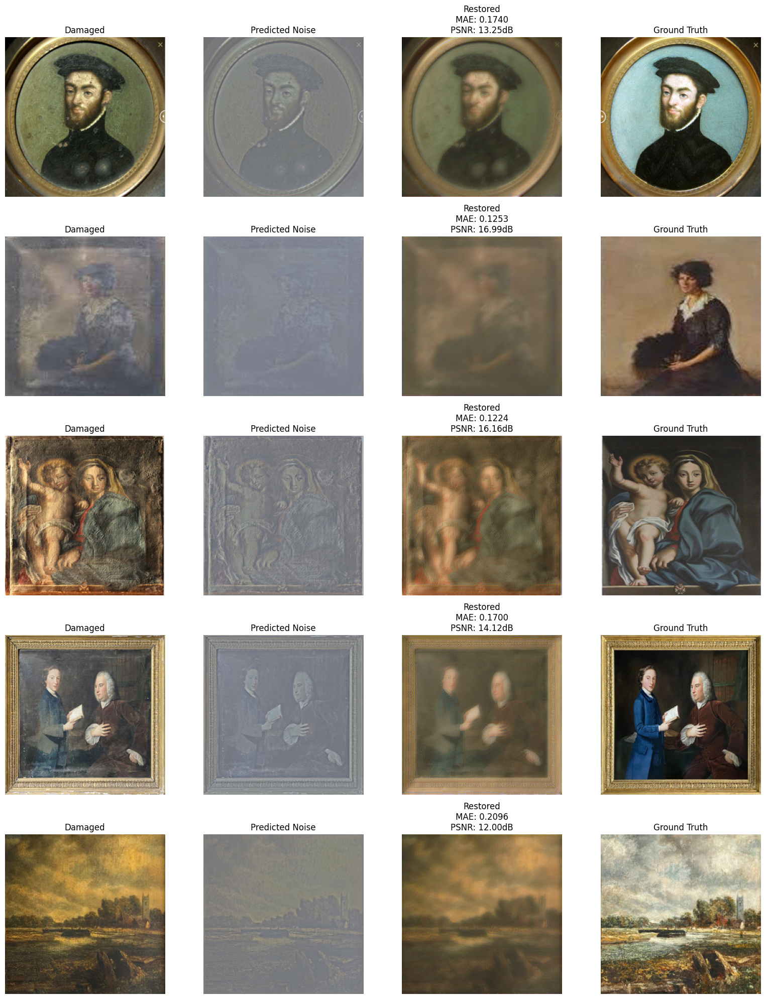


✅ Advanced model training complete!
This model uses AdaIN, CBAM attention, dense skip connections, and perceptual loss
Use restore_image(model, damaged_img) to restore new images


In [ ]:
# ---------- Image dimensions ----------
img_size = (256, 256)

# ---------- Prepare arrays ----------
X = []  # Damaged images (input)
Y = []  # Undamaged images (target)

print(f"Processing {len(common_keys)} matched image pairs...")

for key in tqdm(common_keys):
    try:
        damaged_img = Image.open(os.path.join(damaged_path, damaged_map[key])).convert("RGB").resize(img_size)
        undamaged_img = Image.open(os.path.join(undamaged_path, undamaged_map[key])).convert("RGB").resize(img_size)

        X.append(np.array(damaged_img) / 255.0)   # Normalize to [0,1]
        Y.append(np.array(undamaged_img) / 255.0)
    except Exception as e:
        print(f"⚠️ Error processing {key}: {e}")

# Convert lists to NumPy arrays
X = np.array(X)
Y = np.array(Y)

# ---------- Calculate noise target ----------
Y_noise = X - Y  # This is what the model will predict

print("✅ Input (damaged) shape:", X.shape)
print("✅ Target (undamaged) shape:", Y.shape)
print("✅ Noise target shape:", Y_noise.shape)
print(f"Noise range: [{Y_noise.min():.3f}, {Y_noise.max():.3f}]")

# -------------------------
# Custom AdaIN layer for style transfer
# -------------------------
class AdaptiveInstanceNorm(layers.Layer):
    """Adaptive Instance Normalization for noise-aware feature modulation"""
    def __init__(self, epsilon=1e-5, **kwargs):
        super().__init__(**kwargs)
        self.epsilon = epsilon

    def call(self, inputs):
        content, style = inputs

        # Instance normalization of content
        content_mean = tf.reduce_mean(content, axis=[1, 2], keepdims=True)
        content_var = tf.reduce_mean(tf.square(content - content_mean), axis=[1, 2], keepdims=True)
        content_std = tf.sqrt(content_var + self.epsilon)
        normalized = (content - content_mean) / content_std

        # Get style statistics
        style_mean = tf.reduce_mean(style, axis=[1, 2], keepdims=True)
        style_var = tf.reduce_mean(tf.square(style - style_mean), axis=[1, 2], keepdims=True)
        style_std = tf.sqrt(style_var + self.epsilon)

        # Apply style to normalized content
        return normalized * style_std + style_mean

# -------------------------
# Spatial Attention Module
# -------------------------
class SpatialAttention(layers.Layer):
    """Spatial attention to focus on noisy regions"""
    def __init__(self, kernel_size=7, **kwargs):
        super().__init__(**kwargs)
        self.kernel_size = kernel_size
        self.conv = layers.Conv2D(1, kernel_size, padding='same', activation='sigmoid')

    def call(self, inputs):
        avg_pool = tf.reduce_mean(inputs, axis=-1, keepdims=True)
        max_pool = tf.reduce_max(inputs, axis=-1, keepdims=True)
        concat = tf.concat([avg_pool, max_pool], axis=-1)
        attention = self.conv(concat)
        return inputs * attention

# -------------------------
# Channel Attention Module
# -------------------------
class ChannelAttention(layers.Layer):
    """Channel attention for feature recalibration"""
    def __init__(self, filters, ratio=8, **kwargs):
        super().__init__(**kwargs)
        self.filters = filters
        self.ratio = ratio
        self.shared_dense1 = layers.Dense(filters // ratio, activation='relu')
        self.shared_dense2 = layers.Dense(filters, activation='sigmoid')

    def call(self, inputs):
        avg_pool = tf.reduce_mean(inputs, axis=[1, 2])
        max_pool = tf.reduce_max(inputs, axis=[1, 2])

        avg_out = self.shared_dense2(self.shared_dense1(avg_pool))
        max_out = self.shared_dense2(self.shared_dense1(max_pool))

        attention = tf.expand_dims(tf.expand_dims(avg_out + max_out, 1), 1)
        return inputs * attention

# -------------------------
# CBAM: Convolutional Block Attention Module
# -------------------------
class CBAM(layers.Layer):
    """Combined channel and spatial attention"""
    def __init__(self, filters, ratio=8, kernel_size=7, **kwargs):
        super().__init__(**kwargs)
        self.channel_attention = ChannelAttention(filters, ratio)
        self.spatial_attention = SpatialAttention(kernel_size)

    def call(self, inputs):
        x = self.channel_attention(inputs)
        x = self.spatial_attention(x)
        return x

# -------------------------
# Enhanced Residual Block with AdaIN
# -------------------------
def residual_adain_block(x, style_features, filters, use_attention=True):
    """Residual block with AdaIN and optional attention"""
    shortcut = x

    # First conv + AdaIN
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = AdaptiveInstanceNorm()([x, style_features])
    x = layers.ReLU()(x)

    # Second conv + AdaIN
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = AdaptiveInstanceNorm()([x, style_features])

    # Apply attention before residual connection
    if use_attention:
        x = CBAM(filters)(x)

    # Residual connection
    x = layers.Add()([x, shortcut])
    x = layers.ReLU()(x)
    return x

# -------------------------
# Dense Skip Connection Block
# -------------------------
class DenseSkipConnection(layers.Layer):
    """Dense connection that concatenates and reduces channels"""
    def __init__(self, filters, **kwargs):
        super().__init__(**kwargs)
        self.conv = layers.Conv2D(filters, 1, padding="same")
        self.bn = layers.BatchNormalization()
        self.relu = layers.ReLU()

    def call(self, skip, upsampled):
        # Concatenate skip and upsampled features
        concat = tf.concat([skip, upsampled], axis=-1)
        # Reduce channels back to target filters
        x = self.conv(concat)
        x = self.bn(x)
        x = self.relu(x)
        return x

# -------------------------
# Build Advanced Noise Prediction Model with AdaIN
# -------------------------
def build_advanced_noise_predictor(input_shape=(256, 256, 3), base_filters=64):
    """
    Advanced U-Net with AdaIN, CBAM attention, and dense skip connections
    Optimized for noise prediction with style-aware processing
    """
    inputs = Input(shape=input_shape, name="damaged_input")

    # ===== ENCODER with Multi-scale Feature Extraction =====
    # Level 1: 256x256
    e1 = layers.Conv2D(base_filters, 7, padding="same")(inputs)
    e1 = layers.BatchNormalization()(e1)
    e1 = layers.ReLU()(e1)
    e1 = layers.Conv2D(base_filters, 3, padding="same")(e1)
    e1 = layers.BatchNormalization()(e1)
    e1 = layers.ReLU()(e1)
    e1_pool = layers.MaxPooling2D(2)(e1)

    # Level 2: 128x128
    e2 = layers.Conv2D(base_filters * 2, 3, padding="same")(e1_pool)
    e2 = layers.BatchNormalization()(e2)
    e2 = layers.ReLU()(e2)
    e2 = layers.Conv2D(base_filters * 2, 3, padding="same")(e2)
    e2 = layers.BatchNormalization()(e2)
    e2 = layers.ReLU()(e2)
    e2 = CBAM(base_filters * 2)(e2)
    e2_pool = layers.MaxPooling2D(2)(e2)

    # Level 3: 64x64
    e3 = layers.Conv2D(base_filters * 4, 3, padding="same")(e2_pool)
    e3 = layers.BatchNormalization()(e3)
    e3 = layers.ReLU()(e3)
    e3 = layers.Conv2D(base_filters * 4, 3, padding="same")(e3)
    e3 = layers.BatchNormalization()(e3)
    e3 = layers.ReLU()(e3)
    e3 = CBAM(base_filters * 4)(e3)
    e3_pool = layers.MaxPooling2D(2)(e3)

    # Level 4: 32x32
    e4 = layers.Conv2D(base_filters * 8, 3, padding="same")(e3_pool)
    e4 = layers.BatchNormalization()(e4)
    e4 = layers.ReLU()(e4)
    e4 = layers.Conv2D(base_filters * 8, 3, padding="same")(e4)
    e4 = layers.BatchNormalization()(e4)
    e4 = layers.ReLU()(e4)
    e4 = CBAM(base_filters * 8)(e4)
    e4_pool = layers.MaxPooling2D(2)(e4)

    # ===== BOTTLENECK: 16x16 =====
    bottleneck = layers.Conv2D(base_filters * 16, 3, padding="same")(e4_pool)
    bottleneck = layers.BatchNormalization()(bottleneck)
    bottleneck = layers.ReLU()(bottleneck)

    # Multiple residual blocks with attention in bottleneck
    for _ in range(3):
        shortcut = bottleneck
        bottleneck = layers.Conv2D(base_filters * 16, 3, padding="same")(bottleneck)
        bottleneck = layers.BatchNormalization()(bottleneck)
        bottleneck = layers.ReLU()(bottleneck)
        bottleneck = CBAM(base_filters * 16)(bottleneck)
        bottleneck = layers.Add()([bottleneck, shortcut])
        bottleneck = layers.ReLU()(bottleneck)

    # Extract global style features from bottleneck
    style_vector = layers.GlobalAveragePooling2D()(bottleneck)
    style_vector = layers.Dense(512, activation='relu')(style_vector)
    style_vector = layers.Dropout(0.3)(style_vector)
    style_vector = layers.Dense(256, activation='relu')(style_vector)

    # ===== DECODER with AdaIN and Dense Skip Connections =====
    # Level 4: 16x16 -> 32x32
    d4 = layers.Conv2DTranspose(base_filters * 8, 2, strides=2, padding="same")(bottleneck)
    # Generate style features for this level
    style_feat_d4 = layers.Dense(base_filters * 8)(style_vector)
    style_feat_d4 = layers.Reshape((1, 1, base_filters * 8))(style_feat_d4)
    # Dense skip connection
    d4 = DenseSkipConnection(base_filters * 8)(e4, d4)
    d4 = residual_adain_block(d4, style_feat_d4, base_filters * 8, use_attention=True)
    d4 = residual_adain_block(d4, style_feat_d4, base_filters * 8, use_attention=False)

    # Level 3: 32x32 -> 64x64
    d3 = layers.Conv2DTranspose(base_filters * 4, 2, strides=2, padding="same")(d4)
    style_feat_d3 = layers.Dense(base_filters * 4)(style_vector)
    style_feat_d3 = layers.Reshape((1, 1, base_filters * 4))(style_feat_d3)
    d3 = DenseSkipConnection(base_filters * 4)(e3, d3)
    d3 = residual_adain_block(d3, style_feat_d3, base_filters * 4, use_attention=True)
    d3 = residual_adain_block(d3, style_feat_d3, base_filters * 4, use_attention=False)

    # Level 2: 64x64 -> 128x128
    d2 = layers.Conv2DTranspose(base_filters * 2, 2, strides=2, padding="same")(d3)
    style_feat_d2 = layers.Dense(base_filters * 2)(style_vector)
    style_feat_d2 = layers.Reshape((1, 1, base_filters * 2))(style_feat_d2)
    d2 = DenseSkipConnection(base_filters * 2)(e2, d2)
    d2 = residual_adain_block(d2, style_feat_d2, base_filters * 2, use_attention=True)
    d2 = residual_adain_block(d2, style_feat_d2, base_filters * 2, use_attention=False)

    # Level 1: 128x128 -> 256x256
    d1 = layers.Conv2DTranspose(base_filters, 2, strides=2, padding="same")(d2)
    style_feat_d1 = layers.Dense(base_filters)(style_vector)
    style_feat_d1 = layers.Reshape((1, 1, base_filters))(style_feat_d1)
    d1 = DenseSkipConnection(base_filters)(e1, d1)
    d1 = residual_adain_block(d1, style_feat_d1, base_filters, use_attention=True)
    d1 = residual_adain_block(d1, style_feat_d1, base_filters, use_attention=False)

    # ===== Final Refinement and Noise Prediction =====
    output = layers.Conv2D(base_filters // 2, 3, padding="same")(d1)
    output = layers.BatchNormalization()(output)
    output = layers.ReLU()(output)

    # Multi-scale noise prediction
    noise_coarse = layers.Conv2D(3, 3, padding="same", activation="tanh", name="noise_coarse")(output)
    noise_fine = layers.Conv2D(3, 1, padding="same", activation="tanh", name="noise_fine")(output)

    # Combine coarse and fine predictions
    noise_output = layers.Add(name="predicted_noise")([noise_coarse, noise_fine])
    noise_output = layers.Lambda(lambda x: x * 0.5)(noise_output)  # Scale down combined output

    model = Model(inputs=inputs, outputs=noise_output, name="AdvancedNoisePredictor_AdaIN")
    return model

# -------------------------
# Perceptual loss using VGG features (optional but powerful)
# -------------------------
def build_perceptual_model():
    """Build VGG16 for perceptual loss calculation"""
    vgg = tf.keras.applications.VGG16(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
    vgg.trainable = False

    # Extract features from multiple layers
    outputs = [vgg.get_layer(name).output for name in ['block1_conv2', 'block2_conv2', 'block3_conv3']]
    return Model(vgg.input, outputs, name='perceptual_model')

perceptual_model = build_perceptual_model()

def perceptual_loss(y_true, y_pred):
    """Calculate perceptual loss using VGG features"""
    # Normalize to VGG expected range [-1, 1] to [0, 255]
    y_true_scaled = (y_true + 1) * 127.5
    y_pred_scaled = (y_pred + 1) * 127.5

    # Preprocess for VGG
    y_true_vgg = tf.keras.applications.vgg16.preprocess_input(y_true_scaled)
    y_pred_vgg = tf.keras.applications.vgg16.preprocess_input(y_pred_scaled)

    # Get features
    true_features = perceptual_model(y_true_vgg)
    pred_features = perceptual_model(y_pred_vgg)

    # Calculate loss across multiple layers
    loss = 0.0
    for true_feat, pred_feat in zip(true_features, pred_features):
        loss += tf.reduce_mean(tf.abs(true_feat - pred_feat))

    return loss / len(true_features)

# -------------------------
# Combined loss function
# -------------------------
def combined_noise_loss(y_true, y_pred):
    """
    Multi-component loss for noise prediction:
    - Pixel-wise MAE for direct noise matching
    - MSE for penalizing large errors
    - Perceptual loss for structural similarity
    """
    # Pixel-wise losses
    mae = tf.reduce_mean(tf.abs(y_true - y_pred))
    mse = tf.reduce_mean(tf.square(y_true - y_pred))

    # Gradient loss (preserve edges in noise)
    dy_true, dx_true = tf.image.image_gradients(y_true)
    dy_pred, dx_pred = tf.image.image_gradients(y_pred)
    grad_loss = tf.reduce_mean(tf.abs(dy_true - dy_pred)) + tf.reduce_mean(tf.abs(dx_true - dx_pred))

    # Perceptual loss
    perc_loss = perceptual_loss(y_true, y_pred)

    # Weighted combination
    total_loss = 0.5 * mae + 0.2 * mse + 0.2 * grad_loss + 0.1 * perc_loss
    return total_loss

# -------------------------
# Enhanced metrics
# -------------------------
def noise_psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=2.0)

class NoiseMAE(tf.keras.metrics.Metric):
    def __init__(self, name="noise_mae", **kwargs):
        super().__init__(name=name, **kwargs)
        self.total = self.add_weight(name="total", initializer="zeros")
        self.count = self.add_weight(name="count", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        mae = tf.reduce_mean(tf.abs(y_true - y_pred))
        self.total.assign_add(mae)
        self.count.assign_add(1.0)

    def result(self):
        return self.total / self.count

    def reset_states(self):
        self.total.assign(0.0)
        self.count.assign(0.0)

# -------------------------
# Prepare train/val sets
# -------------------------
X_train, X_val, Y_noise_train, Y_noise_val, Y_train, Y_val = train_test_split(
    X, Y_noise, Y, test_size=0.2, random_state=42
)
print(f"\n📊 Train: {X_train.shape[0]} samples | Val: {X_val.shape[0]} samples")

# -------------------------
# Build & compile model
# -------------------------
tf.keras.backend.clear_session()
model = build_advanced_noise_predictor(input_shape=X.shape[1:], base_filters=64)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
    loss=combined_noise_loss,
    metrics=['mae', 'mse', noise_psnr, NoiseMAE()]
)

model.summary()

# -------------------------
# Data augmentation pipeline
# -------------------------
BATCH_SIZE = 8  # Smaller batch for complex model
AUTOTUNE = tf.data.AUTOTUNE

def augment_noise_pair(damaged, noise_target):
    stacked = tf.concat([damaged, noise_target], axis=-1)

    # Random flips
    if tf.random.uniform(()) > 0.5:
        stacked = tf.image.flip_left_right(stacked)
    if tf.random.uniform(()) > 0.5:
        stacked = tf.image.flip_up_down(stacked)

    # Random rotation
    k = tf.random.uniform((), 0, 4, dtype=tf.int32)
    stacked = tf.image.rot90(stacked, k)

    damaged_aug = stacked[..., :3]
    noise_aug = stacked[..., 3:]

    # Brightness/contrast adjustment
    if tf.random.uniform(()) > 0.5:
        damaged_aug = tf.image.random_brightness(damaged_aug, 0.1)
        damaged_aug = tf.clip_by_value(damaged_aug, 0.0, 1.0)

    if tf.random.uniform(()) > 0.5:
        damaged_aug = tf.image.random_contrast(damaged_aug, 0.8, 1.2)
        damaged_aug = tf.clip_by_value(damaged_aug, 0.0, 1.0)

    return damaged_aug, noise_aug

def make_dataset(X_in, Y_noise_in, training=True):
    ds = tf.data.Dataset.from_tensor_slices((
        X_in.astype(np.float32),
        Y_noise_in.astype(np.float32)
    ))

    if training:
        ds = ds.shuffle(2048, reshuffle_each_iteration=True)
        ds = ds.map(augment_noise_pair, num_parallel_calls=AUTOTUNE)

    ds = ds.batch(BATCH_SIZE, drop_remainder=training)
    ds = ds.prefetch(AUTOTUNE)
    return ds

train_ds = make_dataset(X_train, Y_noise_train, training=True)
val_ds = make_dataset(X_val, Y_noise_val, training=False)

# -------------------------
# Callbacks
# -------------------------
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=25,
        mode='min',
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ModelCheckpoint(
        "best_advanced_noise_predictor.h5",
        monitor="val_loss",
        save_best_only=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=8,
        min_lr=1e-7,
        verbose=1
    )
]

# -------------------------
# Train
# -------------------------
print("\n🚀 Starting training with AdaIN and advanced skip connections...")
EPOCHS = 100

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks,
    verbose=1
)

# -------------------------
# Evaluation
# -------------------------
print("\n📈 Evaluating model...")
sample_indices = np.random.choice(len(X_val), min(5, len(X_val)), replace=False)

fig, axes = plt.subplots(len(sample_indices), 4, figsize=(16, 4 * len(sample_indices)))
if len(sample_indices) == 1:
    axes = axes.reshape(1, -1)

for idx, sample_idx in enumerate(sample_indices):
    damaged_img = X_val[sample_idx:sample_idx+1]
    true_noise = Y_noise_val[sample_idx]
    clean_img = Y_val[sample_idx]

    pred_noise = model.predict(damaged_img, verbose=0)[0]
    restored_img = np.clip(damaged_img[0] - pred_noise, 0, 1)

    mae = np.mean(np.abs(restored_img - clean_img))
    psnr = 10 * np.log10(1.0 / (np.mean((restored_img - clean_img) ** 2) + 1e-10))

    axes[idx, 0].imshow(damaged_img[0])
    axes[idx, 0].set_title("Damaged")
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow((pred_noise + 1) / 2)
    axes[idx, 1].set_title("Predicted Noise")
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(restored_img)
    axes[idx, 2].set_title(f"Restored\nMAE: {mae:.4f}\nPSNR: {psnr:.2f}dB")
    axes[idx, 2].axis('off')

    axes[idx, 3].imshow(clean_img)
    axes[idx, 3].set_title("Ground Truth")
    axes[idx, 3].axis('off')

plt.tight_layout()
plt.savefig('advanced_noise_prediction_results.png', dpi=150, bbox_inches='tight')
plt.show()

# -------------------------
# Restoration function
# -------------------------
def restore_image(model, damaged_image):
    if len(damaged_image.shape) == 3:
        damaged_image = np.expand_dims(damaged_image, 0)

    predicted_noise = model.predict(damaged_image, verbose=0)
    restored = np.clip(damaged_image - predicted_noise, 0, 1)

    return restored[0] if len(damaged_image) == 1 else restored

print("\n✅ Advanced model training complete!")
print("This model uses AdaIN, CBAM attention, dense skip connections, and perceptual loss")
print("Use restore_image(model, damaged_img) to restore new images")

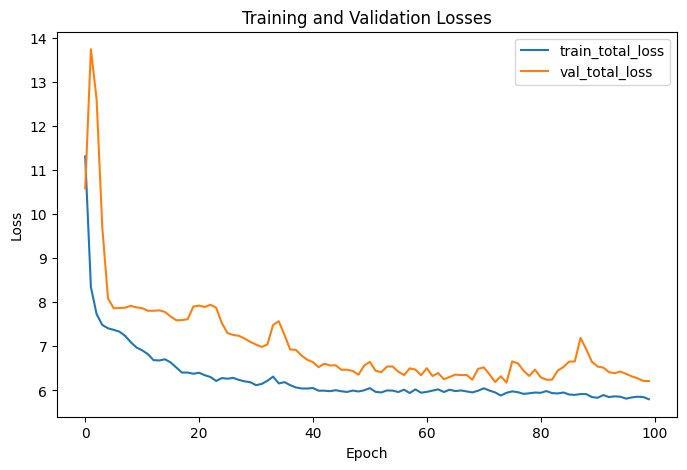

In [ ]:
# -------------------------
# Plot training / validation losses
# -------------------------
hist = history.history
plt.figure(figsize=(8,5))
plt.plot(hist["loss"], label="train_total_loss")
plt.plot(hist["val_loss"], label="val_total_loss")
# also plot restored-specific losses
if "restored_image_loss" in hist:
    plt.plot(hist["restored_image_loss"], label="train_restored_mae")
if "val_restored_image_loss" in hist:
    plt.plot(hist["val_restored_image_loss"], label="val_restored_mae")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Losses")
plt.show()

In [ ]:
# ---------- Image dimensions ----------
img_size = (256, 256)

# ---------- Prepare arrays ----------
X = []  # Damaged images (input)
Y = []  # Undamaged images (target)

print(f"Processing {len(common_keys)} matched image pairs...")

for key in tqdm(common_keys):
    try:
        damaged_img = Image.open(os.path.join(damaged_path, damaged_map[key])).convert("RGB").resize(img_size)
        undamaged_img = Image.open(os.path.join(undamaged_path, undamaged_map[key])).convert("RGB").resize(img_size)

        X.append(np.array(damaged_img) / 255.0)   # Normalize to [0,1]
        Y.append(np.array(undamaged_img) / 255.0)
    except Exception as e:
        print(f"⚠️ Error processing {key}: {e}")

# Convert lists to NumPy arrays
X = np.array(X)
Y = np.array(Y)

# ---------- Output shapes ----------
print("✅ Input (damaged) shape:", X.shape)
print("✅ Target (undamaged) shape:", Y.shape)

Processing 111 matched image pairs...


100%|██████████| 111/111 [00:03<00:00, 32.48it/s]


✅ Input (damaged) shape: (111, 256, 256, 3)
✅ Target (undamaged) shape: (111, 256, 256, 3)


In [ ]:
# -------------------------
# Helper: Pixel-accuracy metric
# -------------------------
def pixel_accuracy(y_true, y_pred, eps=0.05):
    # percent of pixels where absolute error <= eps
    err = tf.abs(y_true - y_pred)
    within = tf.cast(tf.reduce_all(err <= eps, axis=-1), tf.float32)  # require all channels within eps
    return tf.reduce_mean(within)

# Wrap for Keras metric
class PixelAccuracy(tf.keras.metrics.Metric):
    def __init__(self, name="pixel_accuracy", eps=0.05, **kwargs):
        super().__init__(name=name, **kwargs)
        self.eps = eps
        self.total = self.add_weight(name="total", initializer="zeros")
        self.count = self.add_weight(name="count", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        within = tf.reduce_all(tf.abs(y_true - y_pred) <= self.eps, axis=-1)
        within = tf.cast(within, tf.float32)
        self.total.assign_add(tf.reduce_sum(within))
        self.count.assign_add(tf.cast(tf.size(within), tf.float32))

    def result(self):
        return tf.math.divide_no_nan(self.total, self.count)

    def reset_states(self):
        self.total.assign(0.0)
        self.count.assign(0.0)

In [ ]:

# -------------------------
# Custom AdaIN layer
# -------------------------
class AdaIN(layers.Layer):
    def __init__(self, channels, style_dim, epsilon=1e-5, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.style_dim = style_dim
        self.epsilon = epsilon
        self.gamma_dense = layers.Dense(channels)
        self.beta_dense  = layers.Dense(channels)

    def call(self, inputs):
        content, style = inputs
        mean_c = tf.reduce_mean(content, axis=[1,2], keepdims=True)
        var_c = tf.reduce_mean(tf.square(content - mean_c), axis=[1,2], keepdims=True)
        std_c = tf.sqrt(var_c + self.epsilon)
        normalized = (content - mean_c) / std_c

        gamma = self.gamma_dense(style)
        beta  = self.beta_dense(style)
        gamma = tf.reshape(gamma, [-1, 1, 1, self.channels])
        beta  = tf.reshape(beta,  [-1, 1, 1, self.channels])
        return normalized * (1.0 + gamma) + beta


In [ ]:
# -------------------------
# Residual conv block
# -------------------------
def residual_block(x, filters, kernel_size=3, stride=1):
    shortcut = x
    x = layers.Conv2D(filters, kernel_size, strides=stride, padding="same", activation=None)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, kernel_size, strides=1, padding="same", activation=None)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Add()([x, shortcut])
    x = layers.ReLU()(x)
    return x

In [ ]:
# -------------------------
# Build model
# -------------------------
def build_denoise_model(input_shape=(256,256,3), base_filters=64, style_dim=128):
    inp = Input(shape=input_shape, name="damaged_input")

    # ----- Encoder -----
    x = layers.Conv2D(base_filters, 3, padding="same", activation="relu")(inp)
    x = layers.Conv2D(base_filters, 3, padding="same", activation="relu")(x)
    skip1 = x
    x = layers.MaxPool2D()(x)  # 128x128

    x = layers.Conv2D(base_filters*2, 3, padding="same", activation="relu")(x)
    x = residual_block(x, base_filters*2)
    skip2 = x
    x = layers.MaxPool2D()(x)  # 64x64

    x = layers.Conv2D(base_filters*4, 3, padding="same", activation="relu")(x)
    x = residual_block(x, base_filters*4)
    skip3 = x
    x = layers.MaxPool2D()(x)  # 32x32

    x = layers.Conv2D(base_filters*8, 3, padding="same", activation="relu")(x)
    x = residual_block(x, base_filters*8)  # bottleneck

    # ----- Style vector -----
    style_vec = layers.GlobalAveragePooling2D()(x)
    style_vec = layers.Dense(style_dim, activation="relu")(style_vec)
    style_vec = layers.Dense(style_dim, activation="relu")(style_vec)

    # ----- Decoder -----
    # Up 32 -> 64
    x = layers.UpSampling2D(size=(2,2))(x)
    x = layers.Conv2D(base_filters*4, 3, padding="same", activation="relu")(x)
    x = AdaIN(base_filters*4, style_dim)([x, style_vec])
    x = layers.Concatenate()([x, skip3])
    x = layers.Conv2D(base_filters*4, 1, padding="same", activation="relu")(x)  # reduce channels back to 256
    x = residual_block(x, base_filters*4)

    # Up 64 -> 128
    x = layers.UpSampling2D(size=(2,2))(x)
    x = layers.Conv2D(base_filters*2, 3, padding="same", activation="relu")(x)
    x = AdaIN(base_filters*2, style_dim)([x, style_vec])
    x = layers.Concatenate()([x, skip2])
    x = layers.Conv2D(base_filters*2, 1, padding="same", activation="relu")(x)  # reduce channels
    x = residual_block(x, base_filters*2)

    # Up 128 -> 256
    x = layers.UpSampling2D(size=(2,2))(x)
    x = layers.Conv2D(base_filters, 3, padding="same", activation="relu")(x)
    x = AdaIN(base_filters, style_dim)([x, style_vec])
    x = layers.Concatenate()([x, skip1])
    x = layers.Conv2D(base_filters, 1, padding="same", activation="relu")(x)  # reduce channels
    x = residual_block(x, base_filters)

    # ----- Predict noise and restored image -----
    pred_noise = layers.Conv2D(3, 3, padding="same", activation="tanh", name="predicted_noise")(x)

    # restored image = clamp(damaged - predicted_noise, 0, 1)
    # Use Lambda to compute restored as a model output (so we can directly compute loss on it)
    def subtract_and_clip(args):
        damaged, noise = args
        restored = damaged - noise
        return tf.clip_by_value(restored, 0.0, 1.0)

    restored = layers.Lambda(subtract_and_clip, name="restored_image")([inp, pred_noise])

    model = Model(inputs=inp, outputs=[pred_noise, restored], name="Denoise_AE_with_AdaIN")
    return model

In [ ]:
# -------------------------
# Prepare train/val sets
# -------------------------
# Provided by you earlier: X (damaged images), Y (undamaged images) in [0,1]
# Make sure X, Y exist in memory.
assert X.shape[0] == Y.shape[0], "X and Y must have same number of samples"

# Prepare noise target = damaged - undamaged
Y_noise = X - Y  # what the network should predict

X_train, X_val, Y_noise_train, Y_noise_val, Y_train, Y_val = train_test_split(
    X, Y_noise, Y, test_size=0.2, random_state=42
)
print("Train:", X_train.shape, "Val:", X_val.shape)

Train: (88, 256, 256, 3) Val: (23, 256, 256, 3)


In [ ]:
# -------------------------
# Build & compile model
# -------------------------
tf.keras.backend.clear_session()
model = build_denoise_model(input_shape=X.shape[1:], base_filters=64, style_dim=128)

In [ ]:
# custom PSNR metric for restored output
def psnr_metric(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

losses = {"predicted_noise": "mae", "restored_image": "mae"}
loss_weights = {"predicted_noise": 0.5, "restored_image": 1.0}

metrics = {
    "predicted_noise": ["mae", "mse"],
    "restored_image": [tf.keras.metrics.MeanAbsoluteError(name="mae"),
                       tf.keras.metrics.MeanSquaredError(name="mse"),
                       psnr_metric,
                       PixelAccuracy(name="pixel_accuracy", eps=0.03)]
}

model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=losses,
              loss_weights=loss_weights,
              metrics=metrics)

model.summary()

Model: "Denoise_AE_with_AdaIN"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ damaged_input       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ damaged_input[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    147,584 │ re_lu[0][0]       │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 128, 128,  │          0 │ add[0][0]         │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_5[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_6[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 64, 64,    │          0 │ batch_normalizat

 Total params: 11,263,491 (42.97 MB)

 Trainable params: 11,258,115 (42.95 MB)

 Non-trainable params: 5,376 (21.00 KB)

In [ ]:
# -------------------------
# tf.data pipeline (with light augmentation)
# -------------------------
BATCH_SIZE = 8
AUTOTUNE = tf.data.AUTOTUNE

def augment(damaged, noise_target, clean_target):
    # damaged, noise_target, clean_target are tensors
    # combine to ensure same transforms applied
    stacked = tf.concat([damaged, clean_target], axis=-1)  # concat along channels to augment together
    # random flips
    stacked = tf.image.random_flip_left_right(stacked)
    stacked = tf.image.random_flip_up_down(stacked)
    # random rotation by multiples of 90
    k = tf.random.uniform((), 0, 4, dtype=tf.int32)
    stacked = tf.image.rot90(stacked, k)
    # split back
    damaged_aug = stacked[..., :3]
    clean_aug = stacked[..., 3:]
    noise_aug = damaged_aug - clean_aug
    return damaged_aug, noise_aug, clean_aug

def make_dataset(X_in, Y_noise_in, Y_clean_in, training=True):
    ds = tf.data.Dataset.from_tensor_slices((X_in.astype(np.float32), Y_noise_in.astype(np.float32), Y_clean_in.astype(np.float32)))
    if training:
        ds = ds.shuffle(1024)
        ds = ds.map(lambda a,b,c: augment(a,b,c), num_parallel_calls=AUTOTUNE)
    else:
        ds = ds.map(lambda a,b,c: (a,b,c), num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH_SIZE).prefetch(AUTOTUNE)
    # Keras expects: x, y where y corresponds to each output. Our model has two outputs: [pred_noise, restored]
    # So we yield (damaged, (noise_target, clean_target))
    ds = ds.map(lambda damaged, noise, clean: (damaged, {"predicted_noise": noise, "restored_image": clean}), num_parallel_calls=AUTOTUNE)
    return ds

train_ds = make_dataset(X_train, Y_noise_train, Y_train, training=True)
val_ds   = make_dataset(X_val,   Y_noise_val,   Y_val,   training=False)

In [ ]:
# -------------------------
# Callbacks & training
# -------------------------
callbacks = [
    EarlyStopping(monitor="val_restored_image_mae", patience=10, mode='min', restore_best_weights=True),
    ModelCheckpoint("best_denoise_model.h5", monitor="val_restored_image_mae", save_best_only=True)
]

In [ ]:
EPOCHS = 100
history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=EPOCHS,
                    callbacks=callbacks)

Epoch 1/100


KeyboardInterrupt: 

#trial 1 - epochs =30

Epoch 1/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step - loss: 0.3340 - predicted_noise_loss: 0.2559 - predicted_noise_mae: 0.2559 - predicted_noise_mse: 0.1309 - restored_image_loss: 0.2060 - restored_image_mae: 0.2060 - restored_image_mse: 0.0747 - restored_image_pixel_accuracy: 0.0032 - restored_image_psnr_metric: 11.6243WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 613ms/step - loss: 0.3326 - predicted_noise_loss: 0.2545 - predicted_noise_mae: 0.2545 - predicted_noise_mse: 0.1298 - restored_image_loss: 0.2053 - restored_image_mae: 0.2053 - restored_image_mse: 0.0743 - restored_image_pixel_accuracy: 0.0032 - restored_image_psnr_metric: 11.6493 - val_loss: 0.4419 - val_predicted_noise_loss: 0.3881 - val_predicted_noise_mae: 0.3881 - val_predicted_noise_mse: 0.2566 - val_restored_image_loss: 0.2483 - val_restored_image_mae: 0.2478 - val_restored_image_mse: 0.0995 - val_restored_image_pixel_accuracy: 0.0029 - val_restored_image_psnr_metric: 10.2481


Epoch 2/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step - loss: 0.2818 - predicted_noise_loss: 0.2032 - predicted_noise_mae: 0.2032 - predicted_noise_mse: 0.0877 - restored_image_loss: 0.1801 - restored_image_mae: 0.1801 - restored_image_mse: 0.0595 - restored_image_pixel_accuracy: 0.0055 - restored_image_psnr_metric: 12.7323WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 591ms/step - loss: 0.2808 - predicted_noise_loss: 0.2024 - predicted_noise_mae: 0.2024 - predicted_noise_mse: 0.0871 - restored_image_loss: 0.1796 - restored_image_mae: 0.1796 - restored_image_mse: 0.0591 - restored_image_pixel_accuracy: 0.0056 - restored_image_psnr_metric: 12.7587 - val_loss: 0.4033 - val_predicted_noise_loss: 0.3486 - val_predicted_noise_mae: 0.3482 - val_predicted_noise_mse: 0.2237 - val_restored_image_loss: 0.2300 - val_restored_image_mae: 0.2292 - val_restored_image_mse: 0.0876 - val_restored_image_pixel_accuracy: 0.0034 - val_restored_image_psnr_metric: 10.8993


Epoch 3/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step - loss: 0.2609 - predicted_noise_loss: 0.1840 - predicted_noise_mae: 0.1840 - predicted_noise_mse: 0.0692 - restored_image_loss: 0.1689 - restored_image_mae: 0.1689 - restored_image_mse: 0.0509 - restored_image_pixel_accuracy: 0.0051 - restored_image_psnr_metric: 13.3105WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 611ms/step - loss: 0.2610 - predicted_noise_loss: 0.1840 - predicted_noise_mae: 0.1840 - predicted_noise_mse: 0.0693 - restored_image_loss: 0.1690 - restored_image_mae: 0.1690 - restored_image_mse: 0.0511 - restored_image_pixel_accuracy: 0.0051 - restored_image_psnr_metric: 13.3057 - val_loss: 0.3906 - val_predicted_noise_loss: 0.3307 - val_predicted_noise_mae: 0.3300 - val_predicted_noise_mse: 0.2031 - val_restored_image_loss: 0.2266 - val_restored_image_mae: 0.2256 - val_restored_image_mse: 0.0840 - val_restored_image_pixel_accuracy: 0.0032 - val_restored_image_psnr_metric: 11.1186


Epoch 4/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step - loss: 0.2562 - predicted_noise_loss: 0.1795 - predicted_noise_mae: 0.1795 - predicted_noise_mse: 0.0684 - restored_image_loss: 0.1664 - restored_image_mae: 0.1664 - restored_image_mse: 0.0515 - restored_image_pixel_accuracy: 0.0047 - restored_image_psnr_metric: 13.4072WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 596ms/step - loss: 0.2554 - predicted_noise_loss: 0.1791 - predicted_noise_mae: 0.1791 - predicted_noise_mse: 0.0681 - restored_image_loss: 0.1659 - restored_image_mae: 0.1659 - restored_image_mse: 0.0513 - restored_image_pixel_accuracy: 0.0051 - restored_image_psnr_metric: 13.4320 - val_loss: 0.3637 - val_predicted_noise_loss: 0.2996 - val_predicted_noise_mae: 0.2990 - val_predicted_noise_mse: 0.1746 - val_restored_image_loss: 0.2152 - val_restored_image_mae: 0.2142 - val_restored_image_mse: 0.0778 - val_restored_image_pixel_accuracy: 0.0027 - val_restored_image_psnr_metric: 11.4754


Epoch 5/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 501ms/step - loss: 0.2263 - predicted_noise_loss: 0.1576 - predicted_noise_mae: 0.1576 - predicted_noise_mse: 0.0549 - restored_image_loss: 0.1475 - restored_image_mae: 0.1475 - restored_image_mse: 0.0420 - restored_image_pixel_accuracy: 0.0119 - restored_image_psnr_metric: 14.3281WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 612ms/step - loss: 0.2274 - predicted_noise_loss: 0.1583 - predicted_noise_mae: 0.1583 - predicted_noise_mse: 0.0554 - restored_image_loss: 0.1482 - restored_image_mae: 0.1482 - restored_image_mse: 0.0424 - restored_image_pixel_accuracy: 0.0120 - restored_image_psnr_metric: 14.2933 - val_loss: 0.3435 - val_predicted_noise_loss: 0.2743 - val_predicted_noise_mae: 0.2738 - val_predicted_noise_mse: 0.1482 - val_restored_image_loss: 0.2074 - val_restored_image_mae: 0.2065 - val_restored_image_mse: 0.0731 - val_restored_image_pixel_accuracy: 0.0024 - val_restored_image_psnr_metric: 11.7830


Epoch 6/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 557ms/step - loss: 0.2349 - predicted_noise_loss: 0.1628 - predicted_noise_mae: 0.1628 - predicted_noise_mse: 0.0576 - restored_image_loss: 0.1535 - restored_image_mae: 0.1535 - restored_image_mse: 0.0456 - restored_image_pixel_accuracy: 0.0178 - restored_image_psnr_metric: 13.9892 - val_loss: 0.3470 - val_predicted_noise_loss: 0.2694 - val_predicted_noise_mae: 0.2689 - val_predicted_noise_mse: 0.1383 - val_restored_image_loss: 0.2134 - val_restored_image_mae: 0.2126 - val_restored_image_mse: 0.0763 - val_restored_image_pixel_accuracy: 0.0022 - val_restored_image_psnr_metric: 11.5486


Epoch 7/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 509ms/step - loss: 0.2170 - predicted_noise_loss: 0.1497 - predicted_noise_mae: 0.1497 - predicted_noise_mse: 0.0480 - restored_image_loss: 0.1421 - restored_image_mae: 0.1421 - restored_image_mse: 0.0385 - restored_image_pixel_accuracy: 0.0193 - restored_image_psnr_metric: 14.7756WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 624ms/step - loss: 0.2181 - predicted_noise_loss: 0.1504 - predicted_noise_mae: 0.1504 - predicted_noise_mse: 0.0485 - restored_image_loss: 0.1429 - restored_image_mae: 0.1429 - restored_image_mse: 0.0390 - restored_image_pixel_accuracy: 0.0194 - restored_image_psnr_metric: 14.7322 - val_loss: 0.3118 - val_predicted_noise_loss: 0.2432 - val_predicted_noise_mae: 0.2426 - val_predicted_noise_mse: 0.1220 - val_restored_image_loss: 0.1914 - val_restored_image_mae: 0.1905 - val_restored_image_mse: 0.0648 - val_restored_image_pixel_accuracy: 0.0023 - val_restored_image_psnr_metric: 12.3560


Epoch 8/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 10s 558ms/step - loss: 0.2284 - predicted_noise_loss: 0.1565 - predicted_noise_mae: 0.1565 - predicted_noise_mse: 0.0516 - restored_image_loss: 0.1502 - restored_image_mae: 0.1502 - restored_image_mse: 0.0436 - restored_image_pixel_accuracy: 0.0161 - restored_image_psnr_metric: 14.3052 - val_loss: 0.3167 - val_predicted_noise_loss: 0.2368 - val_predicted_noise_mae: 0.2363 - val_predicted_noise_mse: 0.1075 - val_restored_image_loss: 0.1993 - val_restored_image_mae: 0.1986 - val_restored_image_mse: 0.0674 - val_restored_image_pixel_accuracy: 0.0016 - val_restored_image_psnr_metric: 12.1389


Epoch 9/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 515ms/step - loss: 0.2152 - predicted_noise_loss: 0.1463 - predicted_noise_mae: 0.1463 - predicted_noise_mse: 0.0449 - restored_image_loss: 0.1420 - restored_image_mae: 0.1420 - restored_image_mse: 0.0392 - restored_image_pixel_accuracy: 0.0221 - restored_image_psnr_metric: 14.6957WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 617ms/step - loss: 0.2152 - predicted_noise_loss: 0.1463 - predicted_noise_mae: 0.1463 - predicted_noise_mse: 0.0448 - restored_image_loss: 0.1421 - restored_image_mae: 0.1421 - restored_image_mse: 0.0392 - restored_image_pixel_accuracy: 0.0221 - restored_image_psnr_metric: 14.7077 - val_loss: 0.2984 - val_predicted_noise_loss: 0.2179 - val_predicted_noise_mae: 0.2171 - val_predicted_noise_mse: 0.0911 - val_restored_image_loss: 0.1907 - val_restored_image_mae: 0.1898 - val_restored_image_mse: 0.0641 - val_restored_image_pixel_accuracy: 0.0012 - val_restored_image_psnr_metric: 12.4223


Epoch 10/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 561ms/step - loss: 0.2087 - predicted_noise_loss: 0.1409 - predicted_noise_mae: 0.1409 - predicted_noise_mse: 0.0392 - restored_image_loss: 0.1383 - restored_image_mae: 0.1383 - restored_image_mse: 0.0361 - restored_image_pixel_accuracy: 0.0217 - restored_image_psnr_metric: 15.1332 - val_loss: 0.2959 - val_predicted_noise_loss: 0.2090 - val_predicted_noise_mae: 0.2083 - val_predicted_noise_mse: 0.0802 - val_restored_image_loss: 0.1926 - val_restored_image_mae: 0.1917 - val_restored_image_mse: 0.0638 - val_restored_image_pixel_accuracy: 0.0012 - val_restored_image_psnr_metric: 12.4179
Epoch 11/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 577ms/step - loss: 0.2066 - predicted_noise_loss: 0.1391 - predicted_noise_mae: 0.1391 - predicted_noise_mse: 0.0371 - restored_image_loss: 0.1371 - restored_image_mae: 0.1371 - restored_image_mse: 0.0349 - restored_image_pixel_accuracy: 0.0134 - restored_image_psnr_metric: 15.3095 - val_loss: 0.2969 - val_predicted_noise_loss: 0.2053 - val_predicted_noise_mae: 0.2046 - val_predicted_noise_mse: 0.0750 - val_restored_image_loss: 0.1954 - val_restored_image_mae: 0.1946 - val_restored_image_mse: 0.0651 - val_restored_image_pixel_accuracy: 0.0012 - val_restored_image_psnr_metric: 12.3393


Epoch 12/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 569ms/step - loss: 0.2114 - predicted_noise_loss: 0.1421 - predicted_noise_mae: 0.1421 - predicted_noise_mse: 0.0402 - restored_image_loss: 0.1403 - restored_image_mae: 0.1403 - restored_image_mse: 0.0382 - restored_image_pixel_accuracy: 0.0199 - restored_image_psnr_metric: 15.1867 - val_loss: 0.3018 - val_predicted_noise_loss: 0.2101 - val_predicted_noise_mae: 0.2092 - val_predicted_noise_mse: 0.0792 - val_restored_image_loss: 0.1981 - val_restored_image_mae: 0.1972 - val_restored_image_mse: 0.0671 - val_restored_image_pixel_accuracy: 0.0012 - val_restored_image_psnr_metric: 12.1688


Epoch 13/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 583ms/step - loss: 0.2034 - predicted_noise_loss: 0.1366 - predicted_noise_mae: 0.1366 - predicted_noise_mse: 0.0379 - restored_image_loss: 0.1351 - restored_image_mae: 0.1351 - restored_image_mse: 0.0362 - restored_image_pixel_accuracy: 0.0254 - restored_image_psnr_metric: 15.3824 - val_loss: 0.2928 - val_predicted_noise_loss: 0.2045 - val_predicted_noise_mae: 0.2037 - val_predicted_noise_mse: 0.0764 - val_restored_image_loss: 0.1918 - val_restored_image_mae: 0.1909 - val_restored_image_mse: 0.0635 - val_restored_image_pixel_accuracy: 0.0014 - val_restored_image_psnr_metric: 12.4404


Epoch 14/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - loss: 0.2057 - predicted_noise_loss: 0.1382 - predicted_noise_mae: 0.1382 - predicted_noise_mse: 0.0385 - restored_image_loss: 0.1366 - restored_image_mae: 0.1366 - restored_image_mse: 0.0368 - restored_image_pixel_accuracy: 0.0248 - restored_image_psnr_metric: 15.3342WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 630ms/step - loss: 0.2056 - predicted_noise_loss: 0.1382 - predicted_noise_mae: 0.1382 - predicted_noise_mse: 0.0384 - restored_image_loss: 0.1365 - restored_image_mae: 0.1365 - restored_image_mse: 0.0367 - restored_image_pixel_accuracy: 0.0245 - restored_image_psnr_metric: 15.3334 - val_loss: 0.2746 - val_predicted_noise_loss: 0.1929 - val_predicted_noise_mae: 0.1922 - val_predicted_noise_mse: 0.0697 - val_restored_image_loss: 0.1793 - val_restored_image_mae: 0.1785 - val_restored_image_mse: 0.0564 - val_restored_image_pixel_accuracy: 0.0018 - val_restored_image_psnr_metric: 12.9865


Epoch 15/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 581ms/step - loss: 0.1999 - predicted_noise_loss: 0.1343 - predicted_noise_mae: 0.1343 - predicted_noise_mse: 0.0367 - restored_image_loss: 0.1327 - restored_image_mae: 0.1327 - restored_image_mse: 0.0350 - restored_image_pixel_accuracy: 0.0295 - restored_image_psnr_metric: 15.4181 - val_loss: 0.2749 - val_predicted_noise_loss: 0.1908 - val_predicted_noise_mae: 0.1900 - val_predicted_noise_mse: 0.0670 - val_restored_image_loss: 0.1808 - val_restored_image_mae: 0.1799 - val_restored_image_mse: 0.0574 - val_restored_image_pixel_accuracy: 0.0016 - val_restored_image_psnr_metric: 13.0227


Epoch 16/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - loss: 0.1970 - predicted_noise_loss: 0.1322 - predicted_noise_mae: 0.1322 - predicted_noise_mse: 0.0348 - restored_image_loss: 0.1309 - restored_image_mae: 0.1309 - restored_image_mse: 0.0333 - restored_image_pixel_accuracy: 0.0254 - restored_image_psnr_metric: 15.6457WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 634ms/step - loss: 0.1971 - predicted_noise_loss: 0.1322 - predicted_noise_mae: 0.1322 - predicted_noise_mse: 0.0349 - restored_image_loss: 0.1310 - restored_image_mae: 0.1310 - restored_image_mse: 0.0334 - restored_image_pixel_accuracy: 0.0256 - restored_image_psnr_metric: 15.6393 - val_loss: 0.2596 - val_predicted_noise_loss: 0.1798 - val_predicted_noise_mae: 0.1792 - val_predicted_noise_mse: 0.0599 - val_restored_image_loss: 0.1707 - val_restored_image_mae: 0.1700 - val_restored_image_mse: 0.0512 - val_restored_image_pixel_accuracy: 0.0018 - val_restored_image_psnr_metric: 13.4729


Epoch 17/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 583ms/step - loss: 0.2169 - predicted_noise_loss: 0.1458 - predicted_noise_mae: 0.1458 - predicted_noise_mse: 0.0405 - restored_image_loss: 0.1440 - restored_image_mae: 0.1440 - restored_image_mse: 0.0389 - restored_image_pixel_accuracy: 0.0247 - restored_image_psnr_metric: 14.9451 - val_loss: 0.2990 - val_predicted_noise_loss: 0.2070 - val_predicted_noise_mae: 0.2061 - val_predicted_noise_mse: 0.0760 - val_restored_image_loss: 0.1969 - val_restored_image_mae: 0.1960 - val_restored_image_mse: 0.0659 - val_restored_image_pixel_accuracy: 0.0016 - val_restored_image_psnr_metric: 12.3699


Epoch 18/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 582ms/step - loss: 0.1938 - predicted_noise_loss: 0.1301 - predicted_noise_mae: 0.1301 - predicted_noise_mse: 0.0345 - restored_image_loss: 0.1287 - restored_image_mae: 0.1287 - restored_image_mse: 0.0328 - restored_image_pixel_accuracy: 0.0265 - restored_image_psnr_metric: 15.8379 - val_loss: 0.2819 - val_predicted_noise_loss: 0.1957 - val_predicted_noise_mae: 0.1949 - val_predicted_noise_mse: 0.0696 - val_restored_image_loss: 0.1854 - val_restored_image_mae: 0.1845 - val_restored_image_mse: 0.0593 - val_restored_image_pixel_accuracy: 0.0024 - val_restored_image_psnr_metric: 12.8508

Epoch 19/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 576ms/step - loss: 0.2131 - predicted_noise_loss: 0.1430 - predicted_noise_mae: 0.1430 - predicted_noise_mse: 0.0414 - restored_image_loss: 0.1416 - restored_image_mae: 0.1416 - restored_image_mse: 0.0399 - restored_image_pixel_accuracy: 0.0240 - restored_image_psnr_metric: 14.9925 - val_loss: 0.2597 - val_predicted_noise_loss: 0.1779 - val_predicted_noise_mae: 0.1771 - val_predicted_noise_mse: 0.0573 - val_restored_image_loss: 0.1719 - val_restored_image_mae: 0.1711 - val_restored_image_mse: 0.0520 - val_restored_image_pixel_accuracy: 0.0025 - val_restored_image_psnr_metric: 13.4819


Epoch 20/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 522ms/step - loss: 0.1969 - predicted_noise_loss: 0.1322 - predicted_noise_mae: 0.1322 - predicted_noise_mse: 0.0356 - restored_image_loss: 0.1308 - restored_image_mae: 0.1308 - restored_image_mse: 0.0341 - restored_image_pixel_accuracy: 0.0245 - restored_image_psnr_metric: 15.6209WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 624ms/step - loss: 0.1972 - predicted_noise_loss: 0.1324 - predicted_noise_mae: 0.1324 - predicted_noise_mse: 0.0356 - restored_image_loss: 0.1310 - restored_image_mae: 0.1310 - restored_image_mse: 0.0341 - restored_image_pixel_accuracy: 0.0243 - restored_image_psnr_metric: 15.6101 - val_loss: 0.2443 - val_predicted_noise_loss: 0.1666 - val_predicted_noise_mae: 0.1659 - val_predicted_noise_mse: 0.0511 - val_restored_image_loss: 0.1621 - val_restored_image_mae: 0.1614 - val_restored_image_mse: 0.0472 - val_restored_image_pixel_accuracy: 0.0022 - val_restored_image_psnr_metric: 13.9720


Epoch 21/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 522ms/step - loss: 0.2034 - predicted_noise_loss: 0.1365 - predicted_noise_mae: 0.1365 - predicted_noise_mse: 0.0373 - restored_image_loss: 0.1352 - restored_image_mae: 0.1352 - restored_image_mse: 0.0358 - restored_image_pixel_accuracy: 0.0159 - restored_image_psnr_metric: 15.2634WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 624ms/step - loss: 0.2034 - predicted_noise_loss: 0.1365 - predicted_noise_mae: 0.1365 - predicted_noise_mse: 0.0373 - restored_image_loss: 0.1352 - restored_image_mae: 0.1352 - restored_image_mse: 0.0358 - restored_image_pixel_accuracy: 0.0159 - restored_image_psnr_metric: 15.2724 - val_loss: 0.2365 - val_predicted_noise_loss: 0.1611 - val_predicted_noise_mae: 0.1605 - val_predicted_noise_mse: 0.0477 - val_restored_image_loss: 0.1569 - val_restored_image_mae: 0.1563 - val_restored_image_mse: 0.0443 - val_restored_image_pixel_accuracy: 0.0042 - val_restored_image_psnr_metric: 14.2513


Epoch 22/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 519ms/step - loss: 0.2084 - predicted_noise_loss: 0.1397 - predicted_noise_mae: 0.1397 - predicted_noise_mse: 0.0390 - restored_image_loss: 0.1385 - restored_image_mae: 0.1385 - restored_image_mse: 0.0377 - restored_image_pixel_accuracy: 0.0279 - restored_image_psnr_metric: 15.2402WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 621ms/step - loss: 0.2076 - predicted_noise_loss: 0.1392 - predicted_noise_mae: 0.1392 - predicted_noise_mse: 0.0388 - restored_image_loss: 0.1380 - restored_image_mae: 0.1380 - restored_image_mse: 0.0374 - restored_image_pixel_accuracy: 0.0274 - restored_image_psnr_metric: 15.2673 - val_loss: 0.2346 - val_predicted_noise_loss: 0.1596 - val_predicted_noise_mae: 0.1591 - val_predicted_noise_mse: 0.0478 - val_restored_image_loss: 0.1556 - val_restored_image_mae: 0.1551 - val_restored_image_mse: 0.0446 - val_restored_image_pixel_accuracy: 0.0050 - val_restored_image_psnr_metric: 14.3160


Epoch 23/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 574ms/step - loss: 0.1934 - predicted_noise_loss: 0.1297 - predicted_noise_mae: 0.1297 - predicted_noise_mse: 0.0345 - restored_image_loss: 0.1285 - restored_image_mae: 0.1285 - restored_image_mse: 0.0331 - restored_image_pixel_accuracy: 0.0263 - restored_image_psnr_metric: 15.7862 - val_loss: 0.2354 - val_predicted_noise_loss: 0.1601 - val_predicted_noise_mae: 0.1596 - val_predicted_noise_mse: 0.0478 - val_restored_image_loss: 0.1562 - val_restored_image_mae: 0.1556 - val_restored_image_mse: 0.0447 - val_restored_image_pixel_accuracy: 0.0067 - val_restored_image_psnr_metric: 14.3273


Epoch 24/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - loss: 0.2000 - predicted_noise_loss: 0.1342 - predicted_noise_mae: 0.1342 - predicted_noise_mse: 0.0357 - restored_image_loss: 0.1329 - restored_image_mae: 0.1329 - restored_image_mse: 0.0344 - restored_image_pixel_accuracy: 0.0329 - restored_image_psnr_metric: 15.5675WARNING:absl:You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`.
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 621ms/step - loss: 0.1998 - predicted_noise_loss: 0.1341 - predicted_noise_mae: 0.1341 - predicted_noise_mse: 0.0357 - restored_image_loss: 0.1328 - restored_image_mae: 0.1328 - restored_image_mse: 0.0343 - restored_image_pixel_accuracy: 0.0329 - restored_image_psnr_metric: 15.5734 - val_loss: 0.2327 - val_predicted_noise_loss: 0.1579 - val_predicted_noise_mae: 0.1575 - val_predicted_noise_mse: 0.0462 - val_restored_image_loss: 0.1544 - val_restored_image_mae: 0.1539 - val_restored_image_mse: 0.0433 - val_restored_image_pixel_accuracy: 0.0065 - val_restored_image_psnr_metric: 14.3741


Epoch 25/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 577ms/step - loss: 0.1895 - predicted_noise_loss: 0.1271 - predicted_noise_mae: 0.1271 - predicted_noise_mse: 0.0338 - restored_image_loss: 0.1260 - restored_image_mae: 0.1260 - restored_image_mse: 0.0324 - restored_image_pixel_accuracy: 0.0370 - restored_image_psnr_metric: 15.9158 - val_loss: 0.2376 - val_predicted_noise_loss: 0.1616 - val_predicted_noise_mae: 0.1609 - val_predicted_noise_mse: 0.0480 - val_restored_image_loss: 0.1578 - val_restored_image_mae: 0.1572 - val_restored_image_mse: 0.0451 - val_restored_image_pixel_accuracy: 0.0045 - val_restored_image_psnr_metric: 14.2665


Epoch 26/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 574ms/step - loss: 0.1879 - predicted_noise_loss: 0.1262 - predicted_noise_mae: 0.1262 - predicted_noise_mse: 0.0334 - restored_image_loss: 0.1248 - restored_image_mae: 0.1248 - restored_image_mse: 0.0319 - restored_image_pixel_accuracy: 0.0318 - restored_image_psnr_metric: 16.0175 - val_loss: 0.2330 - val_predicted_noise_loss: 0.1581 - val_predicted_noise_mae: 0.1575 - val_predicted_noise_mse: 0.0462 - val_restored_image_loss: 0.1549 - val_restored_image_mae: 0.1542 - val_restored_image_mse: 0.0434 - val_restored_image_pixel_accuracy: 0.0068 - val_restored_image_psnr_metric: 14.3775


Epoch 27/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 581ms/step - loss: 0.1985 - predicted_noise_loss: 0.1330 - predicted_noise_mae: 0.1330 - predicted_noise_mse: 0.0354 - restored_image_loss: 0.1320 - restored_image_mae: 0.1320 - restored_image_mse: 0.0339 - restored_image_pixel_accuracy: 0.0325 - restored_image_psnr_metric: 15.5617 - val_loss: 0.2473 - val_predicted_noise_loss: 0.1693 - val_predicted_noise_mae: 0.1686 - val_predicted_noise_mse: 0.0524 - val_restored_image_loss: 0.1638 - val_restored_image_mae: 0.1630 - val_restored_image_mse: 0.0484 - val_restored_image_pixel_accuracy: 0.0046 - val_restored_image_psnr_metric: 13.8781


Epoch 28/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 578ms/step - loss: 0.1875 - predicted_noise_loss: 0.1262 - predicted_noise_mae: 0.1262 - predicted_noise_mse: 0.0331 - restored_image_loss: 0.1244 - restored_image_mae: 0.1244 - restored_image_mse: 0.0315 - restored_image_pixel_accuracy: 0.0418 - restored_image_psnr_metric: 15.8832 - val_loss: 0.2501 - val_predicted_noise_loss: 0.1722 - val_predicted_noise_mae: 0.1717 - val_predicted_noise_mse: 0.0534 - val_restored_image_loss: 0.1648 - val_restored_image_mae: 0.1643 - val_restored_image_mse: 0.0482 - val_restored_image_pixel_accuracy: 0.0055 - val_restored_image_psnr_metric: 13.8707


Epoch 29/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 581ms/step - loss: 0.1962 - predicted_noise_loss: 0.1319 - predicted_noise_mae: 0.1319 - predicted_noise_mse: 0.0354 - restored_image_loss: 0.1303 - restored_image_mae: 0.1303 - restored_image_mse: 0.0340 - restored_image_pixel_accuracy: 0.0353 - restored_image_psnr_metric: 15.8207 - val_loss: 0.2462 - val_predicted_noise_loss: 0.1674 - val_predicted_noise_mae: 0.1667 - val_predicted_noise_mse: 0.0504 - val_restored_image_loss: 0.1636 - val_restored_image_mae: 0.1628 - val_restored_image_mse: 0.0474 - val_restored_image_pixel_accuracy: 0.0037 - val_restored_image_psnr_metric: 13.9895


Epoch 30/30
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 577ms/step - loss: 0.1843 - predicted_noise_loss: 0.1236 - predicted_noise_mae: 0.1236 - predicted_noise_mse: 0.0322 - restored_image_loss: 0.1225 - restored_image_mae: 0.1225 - restored_image_mse: 0.0309 - restored_image_pixel_accuracy: 0.0447 - restored_image_psnr_metric: 16.0880 - val_loss: 0.2559 - val_predicted_noise_loss: 0.1731 - val_predicted_noise_mae: 0.1723 - val_predicted_noise_mse: 0.0538 - val_restored_image_loss: 0.1706 - val_restored_image_mae: 0.1698 - val_restored_image_mse: 0.0515 - val_restored_image_pixel_accuracy: 0.0047 - val_restored_image_psnr_metric: 13.6577

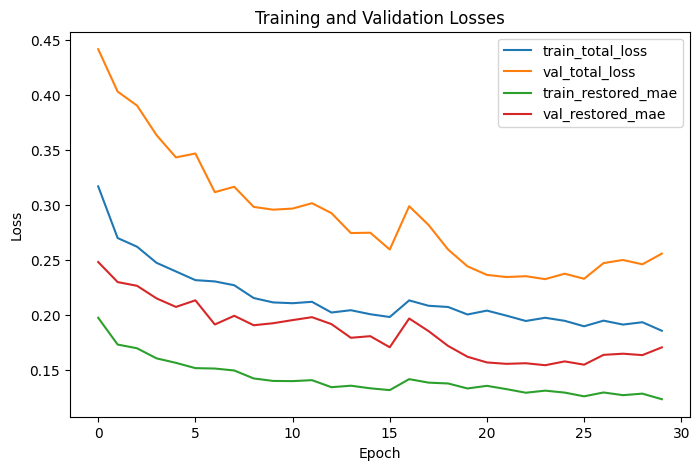

In [ ]:
# -------------------------
# Plot training / validation losses
# -------------------------
hist = history.history
plt.figure(figsize=(8,5))
plt.plot(hist["loss"], label="train_total_loss")
plt.plot(hist["val_loss"], label="val_total_loss")
# also plot restored-specific losses
if "restored_image_loss" in hist:
    plt.plot(hist["restored_image_loss"], label="train_restored_mae")
if "val_restored_image_loss" in hist:
    plt.plot(hist["val_restored_image_loss"], label="val_restored_mae")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Losses")
plt.show()

In [ ]:
# -------------------------
# Visualize a few validation examples
# -------------------------
def show_predictions(model, X_samples, Y_clean, count=5):
    inp = X_samples[:count]
    preds = model.predict(inp)
    pred_noise = preds[0]   # predicted_noise
    restored = preds[1]     # restored_image
    fig, axes = plt.subplots(count, 3, figsize=(10, 3*count))
    for i in range(count):
        axes[i,0].imshow(inp[i])
        axes[i,0].set_title("Damaged")
        axes[i,1].imshow(restored[i])
        axes[i,1].set_title("Restored")
        axes[i,2].imshow(Y_clean[i])
        axes[i,2].set_title("Ground truth")
        for ax in axes[i]:
            ax.axis("off")
    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step


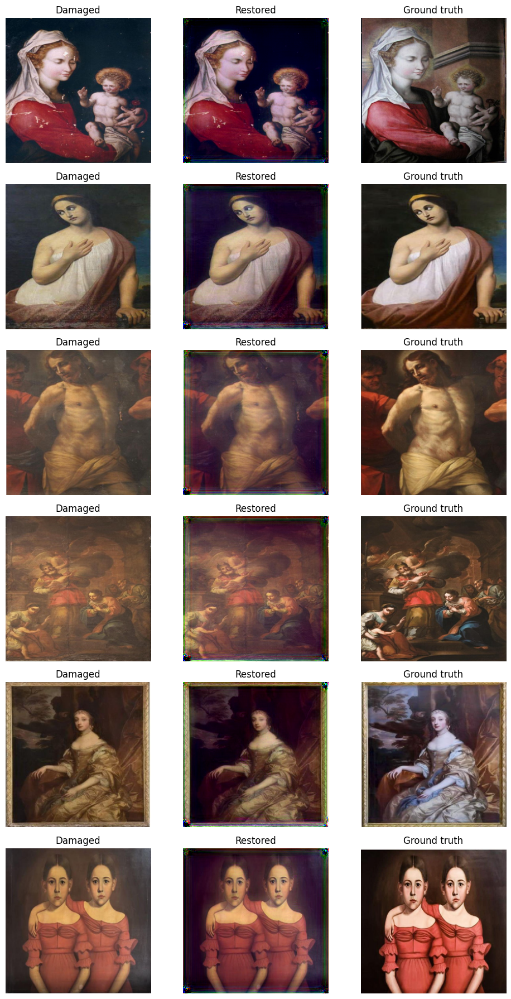

In [ ]:
show_predictions(model, X_val, Y_val, count=min(6, X_val.shape[0]))

In [ ]:
# Save final model (optional)
model.save("denoise_with_adain_and_residuals")

#Ver2 with Pixel + VGG Perceptual loss

**Implementation alone**

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K

# --------------------------
# VGG feature extractor
# --------------------------
def build_vgg_feature_extractor(layer_names, input_shape=(256,256,3)):
    """
    Extracts intermediate feature maps from VGG19 for perceptual loss.
    """
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=input_shape)
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    return Model(inputs=vgg.input, outputs=outputs)

# Example: use relu layers at different depths
vgg_layers = ["block1_conv2", "block2_conv2", "block3_conv4"]
vgg_model = build_vgg_feature_extractor(vgg_layers)

# --------------------------
# Custom perceptual loss
# --------------------------
def perceptual_loss(y_true, y_pred):
    """
    Computes combined pixel MAE + VGG perceptual loss
    """
    # Pixel-wise MAE
    pixel_loss = tf.reduce_mean(tf.abs(y_true - y_pred))

    # Perceptual loss
    # scale to [0,255] because VGG trained on ImageNet
    y_true_scaled = y_true * 255.0
    y_pred_scaled = y_pred * 255.0

    # preprocess for VGG
    y_true_pre = tf.keras.applications.vgg19.preprocess_input(y_true_scaled)
    y_pred_pre = tf.keras.applications.vgg19.preprocess_input(y_pred_scaled)

    true_features = vgg_model(y_true_pre)
    pred_features = vgg_model(y_pred_pre)

    perceptual_loss_val = 0.0
    for t_feat, p_feat in zip(true_features, pred_features):
        perceptual_loss_val += tf.reduce_mean(tf.abs(t_feat - p_feat))

    # combine losses: weight perceptual component
    loss = pixel_loss + 0.1 * perceptual_loss_val
    return loss

# --------------------------
# Build denoising AE model (same as before)
# --------------------------
# Assuming you have build_denoise_model() from previous code
model = build_denoise_model(input_shape=X.shape[1:], base_filters=64, style_dim=128)

# --------------------------
# Compile model with custom loss
# --------------------------
# Model has two outputs: predicted_noise and restored_image
# Use only perceptual loss on restored_image, keep MAE for predicted_noise
losses = {
    "predicted_noise": "mae",           # auxiliary residual loss
    "restored_image": perceptual_loss   # combined pixel + VGG perceptual
}
loss_weights = {"predicted_noise": 0.5, "restored_image": 1.0}

metrics = {
    "predicted_noise": ["mae", "mse"],
    "restored_image": [tf.keras.metrics.MeanAbsoluteError(name="mae"),
                       tf.keras.metrics.MeanSquaredError(name="mse"),
                       psnr_metric,
                       PixelAccuracy(name="pixel_accuracy", eps=0.03)]
}

model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=losses,
              loss_weights=loss_weights,
              metrics=metrics)


In [ ]:
# --------------------------
# Train model using train_ds / val_ds from previous pipeline
# --------------------------
history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=30,
                    callbacks=callbacks)

Epoch 1/30
 1/11 ━━━━━━━━━━━━━━━━━━━━ 19:10 115s/step - loss: 193.1438 - predicted_noise_loss: 0.6744 - predicted_noise_mae: 0.6744 - predicted_noise_mse: 0.5571 - restored_image_loss: 192.8066 - restored_image_mae: 0.4364 - restored_image_mse: 0.2722 - restored_image_pixel_accuracy: 0.0013 - restored_image_psnr_metric: 5.6679

In [ ]:
# ==========================
# Plot losses
# ==========================
hist = history.history
plt.figure(figsize=(8,5))
plt.plot(hist["loss"], label="train_total_loss")
plt.plot(hist["val_loss"], label="val_total_loss")
if "restored_image_loss" in hist:
    plt.plot(hist["restored_image_loss"], label="train_restored_mae")
if "val_restored_image_loss" in hist:
    plt.plot(hist["val_restored_image_loss"], label="val_restored_mae")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

In [ ]:
# ==========================
# Visualize predictions
# ==========================
def show_predictions(model, X_samples, Y_clean, count=5):
    inp = X_samples[:count]
    preds = model.predict(inp)
    restored = preds[1]
    fig, axes = plt.subplots(count,3,figsize=(10,3*count))
    for i in range(count):
        axes[i,0].imshow(inp[i])
        axes[i,0].set_title("Damaged")
        axes[i,1].imshow(restored[i])
        axes[i,1].set_title("Restored")
        axes[i,2].imshow(Y_clean[i])
        axes[i,2].set_title("Ground Truth")
        for ax in axes[i]:
            ax.axis("off")
    plt.tight_layout()
    plt.show()


In [ ]:
show_predictions(model, X_val, Y_val, count=min(6, X_val.shape[0]))

#Complete model with Perceptual loss

In [ ]:
# ==========================
# Required imports
# ==========================
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model, Input
from tensorflow.keras.applications import VGG19
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# ==========================
# Custom pixel accuracy metric
# ==========================
class PixelAccuracy(tf.keras.metrics.Metric):
    def __init__(self, name="pixel_accuracy", eps=0.03, **kwargs):
        super().__init__(name=name, **kwargs)
        self.eps = eps
        self.total = self.add_weight(name="total", initializer="zeros")
        self.count = self.add_weight(name="count", initializer="zeros")
    def update_state(self, y_true, y_pred, sample_weight=None):
        within = tf.reduce_all(tf.abs(y_true - y_pred) <= self.eps, axis=-1)
        within = tf.cast(within, tf.float32)
        self.total.assign_add(tf.reduce_sum(within))
        self.count.assign_add(tf.cast(tf.size(within), tf.float32))
    def result(self):
        return tf.math.divide_no_nan(self.total, self.count)
    def reset_states(self):
        self.total.assign(0.0)
        self.count.assign(0.0)

# ==========================
# PSNR metric
# ==========================
def psnr_metric(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

# ==========================
# Adaptive Instance Normalization (AdaIN)
# ==========================
class AdaIN(layers.Layer):
    def __init__(self, channels, style_dim, epsilon=1e-5, **kwargs):
        super().__init__(**kwargs)
        self.channels = channels
        self.style_dim = style_dim
        self.epsilon = epsilon
        self.gamma_dense = layers.Dense(channels)
        self.beta_dense  = layers.Dense(channels)
    def call(self, inputs):
        content, style = inputs
        mean_c = tf.reduce_mean(content, axis=[1,2], keepdims=True)
        var_c = tf.reduce_mean(tf.square(content - mean_c), axis=[1,2], keepdims=True)
        std_c = tf.sqrt(var_c + self.epsilon)
        normalized = (content - mean_c) / std_c
        gamma = tf.reshape(self.gamma_dense(style), [-1,1,1,self.channels])
        beta  = tf.reshape(self.beta_dense(style),  [-1,1,1,self.channels])
        return normalized * (1.0 + gamma) + beta

# ==========================
# Residual block
# ==========================
def residual_block(x, filters, kernel_size=3):
    shortcut = x
    x = layers.Conv2D(filters, kernel_size, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, kernel_size, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Add()([x, shortcut])
    x = layers.ReLU()(x)
    return x

# ==========================
# Denoising autoencoder model
# ==========================
def build_denoise_model(input_shape=(256,256,3), base_filters=64, style_dim=128):
    inp = Input(shape=input_shape, name="damaged_input")

    # Encoder
    x = layers.Conv2D(base_filters, 3, padding="same", activation="relu")(inp)
    x = layers.Conv2D(base_filters, 3, padding="same", activation="relu")(x)
    skip1 = x
    x = layers.MaxPool2D()(x)  # 128

    x = layers.Conv2D(base_filters*2, 3, padding="same", activation="relu")(x)
    x = residual_block(x, base_filters*2)
    skip2 = x
    x = layers.MaxPool2D()(x)  # 64

    x = layers.Conv2D(base_filters*4, 3, padding="same", activation="relu")(x)
    x = residual_block(x, base_filters*4)
    x = layers.MaxPool2D()(x)  # 32

    x = layers.Conv2D(base_filters*8, 3, padding="same", activation="relu")(x)
    x = residual_block(x, base_filters*8)  # bottleneck

    # style vector
    style_vec = layers.GlobalAveragePooling2D()(x)
    style_vec = layers.Dense(style_dim, activation="relu")(style_vec)
    style_vec = layers.Dense(style_dim, activation="relu")(style_vec)

    # Decoder
    x = layers.UpSampling2D()(x)  # 64
    x = layers.Conv2D(base_filters*4, 3, padding="same", activation="relu")(x)
    x = AdaIN(base_filters*4, style_dim)([x, style_vec])
    x = layers.Concatenate()([x, skip2])
    x = residual_block(x, base_filters*4)

    x = layers.UpSampling2D()(x)  # 128
    x = layers.Conv2D(base_filters*2, 3, padding="same", activation="relu")(x)
    x = AdaIN(base_filters*2, style_dim)([x, style_vec])
    x = layers.Concatenate()([x, skip1])
    x = residual_block(x, base_filters*2)

    x = layers.UpSampling2D()(x)  # 256
    x = layers.Conv2D(base_filters, 3, padding="same", activation="relu")(x)
    x = AdaIN(base_filters, style_dim)([x, style_vec])

    # Predict noise (residual)
    pred_noise = layers.Conv2D(3, 3, padding="same", activation="tanh", name="predicted_noise")(x)

    # Restored image = clamp(damaged - predicted_noise, 0, 1)
    restored = layers.Lambda(lambda args: tf.clip_by_value(args[0]-args[1],0,1), name="restored_image")([inp, pred_noise])

    return Model(inputs=inp, outputs=[pred_noise, restored], name="Denoise_AE_AdaIN")

# ==========================
# VGG perceptual loss
# ==========================
def build_vgg_feature_extractor(layer_names, input_shape=(256,256,3)):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=input_shape)
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    return Model(inputs=vgg.input, outputs=outputs)

vgg_layers = ["block1_conv2", "block2_conv2", "block3_conv4"]
vgg_model = build_vgg_feature_extractor(vgg_layers)

def perceptual_loss(y_true, y_pred):
    # Pixel MAE
    pixel_loss = tf.reduce_mean(tf.abs(y_true - y_pred))

    # Perceptual loss
    y_true_scaled = y_true * 255.0
    y_pred_scaled = y_pred * 255.0
    y_true_pre = tf.keras.applications.vgg19.preprocess_input(y_true_scaled)
    y_pred_pre = tf.keras.applications.vgg19.preprocess_input(y_pred_scaled)

    true_features = vgg_model(y_true_pre)
    pred_features = vgg_model(y_pred_pre)

    perceptual_loss_val = 0.0
    for t_feat, p_feat in zip(true_features, pred_features):
        perceptual_loss_val += tf.reduce_mean(tf.abs(t_feat - p_feat))

    # Combined loss
    return pixel_loss + 0.1 * perceptual_loss_val

# ==========================
# Prepare dataset
# ==========================
# X = damaged images, Y = clean images in [0,1]
Y_noise = X - Y

X_train, X_val, Y_noise_train, Y_noise_val, Y_train, Y_val = train_test_split(
    X, Y_noise, Y, test_size=0.2, random_state=42
)

BATCH_SIZE = 8
AUTOTUNE = tf.data.AUTOTUNE

def augment(damaged, noise_target, clean_target):
    stacked = tf.concat([damaged, clean_target], axis=-1)
    stacked = tf.image.random_flip_left_right(stacked)
    stacked = tf.image.random_flip_up_down(stacked)
    k = tf.random.uniform((),0,4,dtype=tf.int32)
    stacked = tf.image.rot90(stacked,k)
    damaged_aug = stacked[..., :3]
    clean_aug = stacked[..., 3:]
    noise_aug = damaged_aug - clean_aug
    return damaged_aug, noise_aug, clean_aug

def make_dataset(X_in, Y_noise_in, Y_clean_in, training=True):
    ds = tf.data.Dataset.from_tensor_slices((X_in.astype(np.float32), Y_noise_in.astype(np.float32), Y_clean_in.astype(np.float32)))
    if training:
        ds = ds.shuffle(1024).map(lambda a,b,c: augment(a,b,c), num_parallel_calls=AUTOTUNE)
    else:
        ds = ds.map(lambda a,b,c: (a,b,c), num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH_SIZE).prefetch(AUTOTUNE)
    ds = ds.map(lambda damaged, noise, clean: (damaged, {"predicted_noise": noise, "restored_image": clean}), num_parallel_calls=AUTOTUNE)
    return ds

train_ds = make_dataset(X_train, Y_noise_train, Y_train, training=True)
val_ds   = make_dataset(X_val,   Y_noise_val,   Y_val,   training=False)

# ==========================
# Build & compile model
# ==========================
tf.keras.backend.clear_session()
model = build_denoise_model(input_shape=X.shape[1:], base_filters=64, style_dim=128)
model.summary()

losses = {"predicted_noise": "mae", "restored_image": perceptual_loss}
loss_weights = {"predicted_noise": 0.5, "restored_image": 1.0}
metrics = {
    "predicted_noise": ["mae","mse"],
    "restored_image": [tf.keras.metrics.MeanAbsoluteError(name="mae"),
                       tf.keras.metrics.MeanSquaredError(name="mse"),
                       psnr_metric,
                       PixelAccuracy(name="pixel_accuracy", eps=0.03)]
}

model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=losses,
              loss_weights=loss_weights,
              metrics=metrics)

# ==========================
# Callbacks & training
# ==========================
callbacks = [
    EarlyStopping(monitor="val_restored_image_mae", patience=10, restore_best_weights=True),
    ModelCheckpoint("best_denoise_model.h5", monitor="val_restored_image_mae", save_best_only=True)
]




80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


ValueError: A `Concatenate` layer requires inputs with matching shapes except for the concatenation axis. Received: input_shape=[(None, 64, 64, 256), (None, 128, 128, 128)]

In [ ]:
EPOCHS = 30
history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=callbacks)


In [ ]:

# ==========================
# Plot losses
# ==========================
hist = history.history
plt.figure(figsize=(8,5))
plt.plot(hist["loss"], label="train_total_loss")
plt.plot(hist["val_loss"], label="val_total_loss")
if "restored_image_loss" in hist:
    plt.plot(hist["restored_image_loss"], label="train_restored_mae")
if "val_restored_image_loss" in hist:
    plt.plot(hist["val_restored_image_loss"], label="val_restored_mae")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

# ==========================
# Visualize predictions
# ==========================
def show_predictions(model, X_samples, Y_clean, count=5):
    inp = X_samples[:count]
    preds = model.predict(inp)
    restored = preds[1]
    fig, axes = plt.subplots(count,3,figsize=(10,3*count))
    for i in range(count):
        axes[i,0].imshow(inp[i])
        axes[i,0].set_title("Damaged")
        axes[i,1].imshow(restored[i])
        axes[i,1].set_title("Restored")
        axes[i,2].imshow(Y_clean[i])
        axes[i,2].set_title("Ground Truth")
        for ax in axes[i]:
            ax.axis("off")
    plt.tight_layout()
    plt.show()

show_predictions(model, X_val, Y_val, count=min(6, X_val.shape[0]))

#Adding a high-frequency (edge) emphasis to the loss

In [ ]:
#Adding this to the pipeline

# ---------------------------
# High-frequency (edge) loss
# ---------------------------
def high_frequency_loss(y_true, y_pred):
    """
    Computes MAE on image gradients to emphasize edges.
    """
    # Sobel edges
    def sobel_edges(img):
        # img shape: (batch, H, W, 3)
        gx = tf.image.sobel_edges(img)[...,0]  # horizontal gradient
        gy = tf.image.sobel_edges(img)[...,1]  # vertical gradient
        grad = tf.sqrt(tf.square(gx) + tf.square(gy) + 1e-6)
        return grad

    grad_true = sobel_edges(y_true)
    grad_pred = sobel_edges(y_pred)

    return tf.reduce_mean(tf.abs(grad_true - grad_pred))

# ---------------------------
# Updated combined loss
# ---------------------------
def combined_loss(y_true, y_pred):
    """
    Pixel MAE + VGG perceptual + high-frequency gradient loss
    """
    # Pixel MAE
    pixel_loss = tf.reduce_mean(tf.abs(y_true - y_pred))

    # VGG perceptual
    y_true_scaled = y_true * 255.0
    y_pred_scaled = y_pred * 255.0
    y_true_pre = tf.keras.applications.vgg19.preprocess_input(y_true_scaled)
    y_pred_pre = tf.keras.applications.vgg19.preprocess_input(y_pred_scaled)
    true_features = vgg_model(y_true_pre)
    pred_features = vgg_model(y_pred_pre)
    perceptual_loss_val = 0.0
    for t_feat, p_feat in zip(true_features, pred_features):
        perceptual_loss_val += tf.reduce_mean(tf.abs(t_feat - p_feat))

    # High-frequency loss
    hf_loss = high_frequency_loss(y_true, y_pred)

    # Combine with weights
    return pixel_loss + 0.1 * perceptual_loss_val + 0.2 * hf_loss


In [ ]:
#adding this to model compilation

losses = {
    "predicted_noise": "mae",           # still residual loss
    "restored_image": combined_loss      # now includes pixel+VGG+HF
}
loss_weights = {"predicted_noise": 0.5, "restored_image": 1.0}

model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=losses,
              loss_weights=loss_weights,
              metrics=metrics)
